In [1]:
import sys
import os
import sklearn.metrics
import sklearn.cluster
import skhubness
from os import path
current_folder = path.dirname(path.abspath('')) 
sys.path.append(current_folder)
from geomle import geomle, mle, DataGenerator
import re
import seaborn as sns
import scanpy as sc
import sklearn as sk
from sklearn.preprocessing import LabelEncoder
import multiprocessing as mp
import multiprocessing
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
import matplotlib as mpl
from matplotlib import pyplot as plt
import umap
import skdim
import seaborn as sns
import random
import time
import numpy as np
import pandas as pd
import pickle
import rpy2
import rpy2.robjects as ro
import rpy2.robjects.numpy2ri
import rpy2.robjects.packages as rpackages
from functools import wraps
import subprocess
from operator import itemgetter
from utils import *
import anndata2ri
import gc

anndata2ri.activate()
readRDS = ro.r['readRDS']
ro.numpy2ri.activate()
utils = rpackages.importr('utils')
%load_ext rpy2.ipython

/home/utilisateur/.local/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/home/utilisateur/.local/lib/python3.7/site-packages/anndata/core/anndata.py:17: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


In [1]:
import louvain
import leidenalg
from sklearn.model_selection import ShuffleSplit, StratifiedShuffleSplit
from sklearn.model_selection import cross_val_score
from IPython.display import display

def color_sign_df(value):
    """
    Colors elements in a dateframe
    green if positive and red if
    negative. Does not color NaN
    values.
    """

    if value < 0:
        color = 'red'
    elif value > 0:
        color = 'green'
    else:
        color = 'black'

    return 'color: %s' % color

def get_split(X,y,stratified=True,n_splits=5,leave_out=.1,random_state=0):
    if stratified:
        split = StratifiedShuffleSplit(n_splits=n_splits, test_size=leave_out, random_state=random_state).split(X,y)
    else:
        split = ShuffleSplit(n_splits=n_splits, test_size=leave_out, random_state=random_state).split(X)        
    
    subs_data = []
    for sel_idx,excl_idx in split:
        subs_data.append((X[sel_idx],y[sel_idx]))
    return subs_data, split

def get_rand_score(y,res_dict,keys_list=['leiden','louvain','spectral','spectral_hub']):
        return pd.Series(data=[sklearn.metrics.cluster.adjusted_rand_score(y,res_dict[k]) for k in keys_list],index=keys_list)

def test_kneighbors_clustering(X,y,cv=5,n_neighbors=10,metric='cosine',hubness='dis_sim_local',hubness_params=None):

    knn_standard = skhubness.neighbors.KNeighborsClassifier(n_neighbors=n_neighbors,
                                        metric=metric)
    acc_standard = cross_val_score(knn_standard, X, y, cv=cv)

    # kNN with hubness reduction
    knn_hubness = skhubness.neighbors.KNeighborsClassifier(n_neighbors=n_neighbors,
                                  metric=metric,
                                  hubness=hubness,
                                  hubness_params=hubness_params)
    acc_hubness = cross_val_score(knn_hubness, X, y, cv=cv)

    print(f'Accuracy (vanilla kNN): {acc_standard.mean():.3f}')
    print(f'Accuracy (kNN with hubness reduction): {acc_hubness.mean():.3f}')

    hub = skhubness.Hubness(k=n_neighbors, metric=metric)
    hub.fit(X)
    k_skew = hub.score()
    print(f'\nSkewness = {k_skew:.3f}')
    print(f'Robin hood index: {hub.robinhood_index:.3f}')
    print(f'Antihub occurrence: {hub.antihub_occurrence:.3f}')
    print(f'Hub occurrence: {hub.hub_occurrence:.3f}')


    hub_red = skhubness.Hubness(k=n_neighbors, metric=metric,
                     hubness=hubness)
    hub_red.fit(X)
    k_skew_hubness = hub_red.score()
    print(f'\nSkewness after Hubness reduction: {k_skew_hubness:.3f} '
          f'(reduction of {k_skew - k_skew_hubness:.3f})')
    print(f'Robin hood: {hub_red.robinhood_index:.3f} '
          f'(reduction of {hub.robinhood_index - hub_red.robinhood_index:.3f})')
    print(f'Antihub occurrence: {hub_red.antihub_occurrence:.3f}')
    print(f'Hub occurrence: {hub_red.hub_occurrence:.3f}')
    
    return acc_standard, acc_hubness, k_skew, k_skew_hubness



def vanilla_clustering(X, adata, metric='cosine', n_neighbors = 10, n_clusters = None, resolution = 1.0, weighted = True, seed = 0, store = True):
    #base performance - vanilla kNN
    knn = skhubness.neighbors.NearestNeighbors(n_neighbors=n_neighbors,metric=metric)
    knn.fit(X)
    adjmat = knn.kneighbors_graph(mode='connectivity')
    weighted_adjmat = knn.kneighbors_graph(mode='distance')


    #spectral clustering input
    if n_clusters is None:
        n_clusters=len(adata.uns['Phenotype'].unique())  
    affinity_matrix = 0.5 * (adjmat + adjmat.T)
    weighted_affinity_matrix = 0.5 * (weighted_adjmat + weighted_adjmat.T)
    #spectral clustering
    spectral = sklearn.cluster.SpectralClustering(n_clusters = n_clusters,
                                       affinity = 'precomputed',
                                       random_state = seed)
    spectral_clus = spectral.fit(affinity_matrix).labels_


    #louvain/leiden input
    louvain.set_rng_seed(seed)
    if weighted:
        G = sc.utils.get_igraph_from_adjacency(weighted_adjmat, directed=False)
        weights = np.array(G.es["weight"]).astype(np.float64)
    else:
        G = sc.utils.get_igraph_from_adjacency(adjmat, directed=False)
        weights = None

    #louvain/leiden clustering
    part_louvain = louvain.find_partition(graph = G, 
                                       partition_type = louvain.RBConfigurationVertexPartition, 
                                       weights = weights,
                                       resolution_parameter=1.0)
    louvain_clus = np.array(part_louvain.membership)

    part_leiden = leidenalg.find_partition(graph = G, 
                             partition_type = leidenalg.RBConfigurationVertexPartition, 
                             weights = weights,
                             resolution_parameter=1.0,
                             seed=seed)
    leiden_clus = np.array(part_leiden.membership)
    
    if store:
        adata.uns['louvain_base'] = louvain_clus
        adata.uns['leiden_base'] = leiden_clus
        adata.uns['spectral'] = spectral_clus
        
    del locals()['adata'], locals()['X']
    return locals()

def hubness_aware_clustering(X, adata, metric='cosine', hubness='local_scaling', hubness_params=None, weighted = True, n_neighbors = 10, n_clusters = None, resolution = 1.0, seed = 0, store = True):
    
    # performance with hubness reduced 
    knn_hub = skhubness.neighbors.NearestNeighbors(n_neighbors=n_neighbors,metric=metric,hubness=hubness,hubness_params=hubness_params)
    knn_hub.fit(X)
    adjmat = knn_hub.kneighbors_graph(mode='connectivity')
    weighted_adjmat = knn_hub.kneighbors_graph(mode='distance')

    #spectral clustering input
    if n_clusters is None:
        n_clusters=len(adata.uns['Phenotype'].unique())  
        
    affinity_matrix = 0.5 * (adjmat + adjmat.T)
    weighted_affinity_matrix = 0.5 * (weighted_adjmat + weighted_adjmat.T)
    #spectral clustering
    spectral = sklearn.cluster.SpectralClustering(n_clusters = n_clusters,
                                       affinity = 'precomputed',
                                       random_state = seed)
    spectral_clus = spectral.fit(affinity_matrix).labels_


    #louvain/leiden input
    louvain.set_rng_seed(seed)
    if weighted:
        G = sc.utils.get_igraph_from_adjacency(weighted_adjmat, directed=False)
        weights = np.array(G.es["weight"]).astype(np.float64)
    else:
        G = sc.utils.get_igraph_from_adjacency(adjmat, directed=False)
        weights = None
        
    #louvain/leiden clustering
    part_louvain = louvain.find_partition(graph = G, 
                                       partition_type = louvain.RBConfigurationVertexPartition, 
                                       weights = weights,
                                       resolution_parameter=resolution)
    louvain_clus = np.array(part_louvain.membership)

    part_leiden = leidenalg.find_partition(graph = G, 
                             partition_type = leidenalg.RBConfigurationVertexPartition, 
                             weights = weights,
                             resolution_parameter=resolution,
                             seed=seed)
    leiden_clus = np.array(part_leiden.membership)
    
    if store:
        adata.uns['louvain_hub'] = louvain_clus
        adata.uns['leiden_hub'] = leiden_clus
        adata.uns['spectral_hub'] = spectral_clus
    
    del locals()['adata'], locals()['X']
    return locals()


def clustering_analysis(adata,retained_cells_idx,
                        n_neighbors = 10,
                        n_clusters = None,
                        metric = 'cosine',
                        resolution = 1.0,
                        weighted = True,  #weighted adjmat for louvain/leiden clustering ?
                        seed = 0,
                        n_splits = 10,    #repeat subsampling x times
                        leave_out = 0.05, #subsampling fraction
                        hubness = 'local_scaling',
                        hubness_params = {'method':'nicdm'},
                        show_plot = True,
                        show_score = True,
                        plot_title = None):
    
    if n_clusters is None:
        n_clusters = len(np.unique(adata.uns['Phenotype']))
        
    #preprocessing
    if np.all(np.around(adata.X)==adata.X): #is count matrix?
        sc.pp.log1p(adata)
    sc.pp.pca(adata)
    sc.pp.neighbors(adata, n_neighbors=n_neighbors, metric=metric)
    sc.tl.leiden(adata,resolution=resolution)
    sc.tl.louvain(adata,resolution=resolution)
    
    #cluster all data, store results in adata
    clus_results = vanilla_clustering(adata.X, adata, 
                                      metric=metric, n_neighbors=n_neighbors,n_clusters = n_clusters, 
                                      resolution = resolution, weighted = weighted, seed = seed,store=True)
    hubclus_results = hubness_aware_clustering(adata.X, adata, 
                                               metric=metric, hubness=hubness, hubness_params=hubness_params, 
                                               n_neighbors=n_neighbors,n_clusters = n_clusters, 
                                               resolution = resolution, weighted = weighted, seed = seed,store=True)

    #full clustering results are stored in adata.obs directly with these keys
    keys = ['leiden_base','leiden_hub','louvain_base','louvain_hub','spectral','spectral_hub','leiden','louvain','Phenotype']
    
    tmp = []
    for k in keys:
        if k == 'Phenotype':
            tmp.append(1.0)
        elif k in ['leiden','louvain']:  #issue with keys stored in uns
            tmp.append(sklearn.metrics.cluster.adjusted_rand_score(adata.uns['Phenotype'],adata.obs[k][retainedcells_idx]))
        else:
            tmp.append(sklearn.metrics.cluster.adjusted_rand_score(adata.uns['Phenotype'],adata.uns[k][retainedcells_idx]))
            
    randscores = adata.uns['full_randscore'] = pd.Series(data=tmp,index=keys)

    #scatter plot results
    if show_plot:
        f,ax=plt.subplots(3,3,figsize=(20,10))
        ax=list(ax.flat)
        for i,k in enumerate(keys):
            if k == 'Phenotype':
                col, legend = labels_to_color(adata.uns[k])
            elif k in ['leiden','louvain']:  #issue with keys stored in uns
                col, legend = labels_to_color(adata.obs[k][retainedcells_idx])
            else:
                col, legend = labels_to_color(adata.uns[k][retainedcells_idx])
            ax[i].set_title(k+f' {randscores[k]:.2f}')
            ax[i].scatter(*adata.obsm['X_umap'][retainedcells_idx].T,c=col,s=5)
            ax[i].legend(handles=legend,bbox_to_anchor=[0,0,1,1])
        if plot_title is not None:
            plt.suptitle(plot_title,y=1.1)
        plt.tight_layout()
        plt.show()


    #cluster all data stratified or non-stratified subsamples, store results in adata
#     if len(adata.X) == len(adata.uns['Phenotype']):
#         keys = ['leiden_clus','louvain_clus','spectral_clus'] #result keys

#         for strat in [True,False]:

#             subs_data, split = get_split(adata.X, y=adata.uns['Phenotype'], stratified=strat, n_splits=n_splits, leave_out=leave_out)

#             randscores = []
#             randscores_hub = []
#             for it,(data,labels) in enumerate(subs_data): 
#                 #run clustering
#                 clus_results = vanilla_clustering(data, adata, 
#                                                   metric=metric,n_neighbors=n_neighbors, n_clusters = n_clusters, 
#                                                   resolution = resolution, weighted = weighted, seed = seed, store = False)
#                 hubclus_results = hubness_aware_clustering(data, adata, 
#                                                   metric=metric, hubness=hubness, hubness_params=hubness_params,
#                                                   n_neighbors=n_neighbors, n_clusters = n_clusters, 
#                                                   resolution = resolution, weighted = weighted, seed = seed, store = False)

#                 #get scores
#                 randscores.append(get_rand_score(labels, clus_results,keys))
#                 randscores_hub.append(get_rand_score(labels, hubclus_results, keys))

#             #final storage of scores
#             if strat:
#                 adata.uns['stratsubs_randscores'] = pd.concat(randscores,axis=1)
#                 adata.uns['stratsubs_randscores_hub'] = pd.concat(randscores_hub,axis=1)
#             else:
#                 adata.uns['subs_randscores'] = pd.concat(randscores,axis=1)
#                 adata.uns['subs_randscores_hub'] = pd.concat(randscores_hub,axis=1)
#         display((adata.uns['stratsubs_randscores_hub']-adata.uns['stratsubs_randscores']).style.applymap(color_sign_df))

    #hubness before/after
    hub = skhubness.Hubness(k=n_neighbors, metric=metric,random_state=seed,return_value='all')
    hub.fit(adata.X)
    hub_scores = hub.score()
    hub_df = pd.DataFrame.from_dict(data=hub_scores,orient='index',columns=['Base hubness'])
    del hub
    gc.collect()
    
    hub_red = skhubness.Hubness(k=n_neighbors, metric=metric,random_state=seed,return_value='all',
                     hubness=hubness,hubness_params=hubness_params)
    hub_red.fit(adata.X)
    hub_red_scores = hub_red.score()
    hub_red_df = pd.DataFrame.from_dict(data=hub_red_scores,orient='index',columns=['Reduced hubness'])
    del hub_red
    gc.collect()
    adata.uns['Hubness_df'] = pd.concat((hub_df,hub_red_df),axis=1)


    if show_score:
        display(adata.uns['Hubness_df'])

# Run all datasets

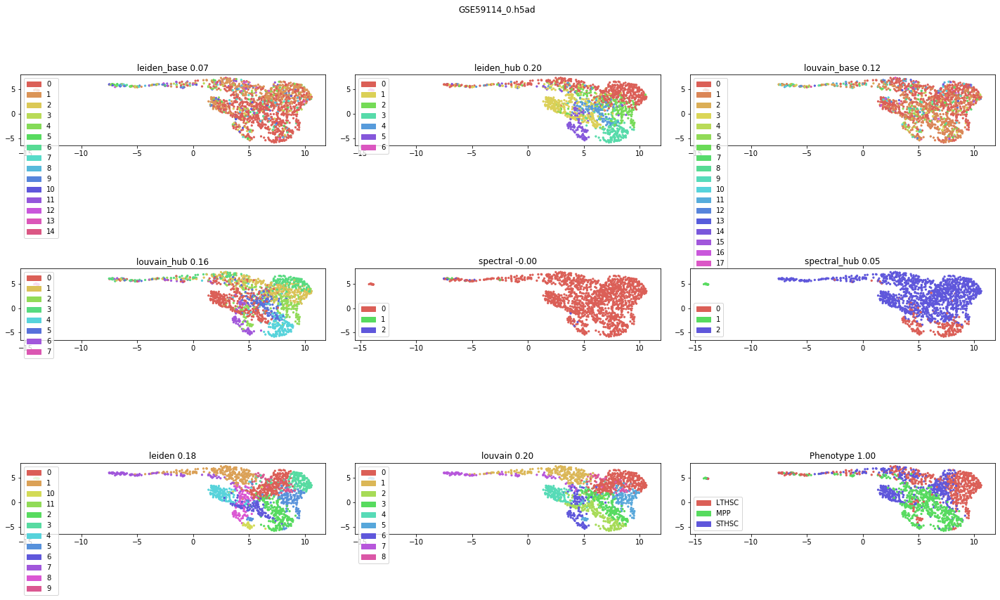

,Base hubness,Reduced hubness
k_skewness,12.3579,3.47507
k_skewness_truncnorm,1.4953,1.10176
atkinson,0.974154,0.460403
gini,0.988179,0.704306
robinhood,0.963164,0.543696
antihubs,"[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 14, 15, 17...","[0, 3, 8, 10, 18, 19, 20, 22, 29, 30, 31, 39, ..."
antihub_occurrence,0.769468,0.199629
hubs,"[1105, 1135, 1236, 1345, 1391, 1437, 1448, 145...","[9, 15, 24, 50, 56, 69, 76, 77, 81, 83, 92, 98..."
hub_occurrence,0.969963,0.644499
groupie_ratio,0.0972806,0.00945612




-------------------------------------------------------------------------------------------------------------





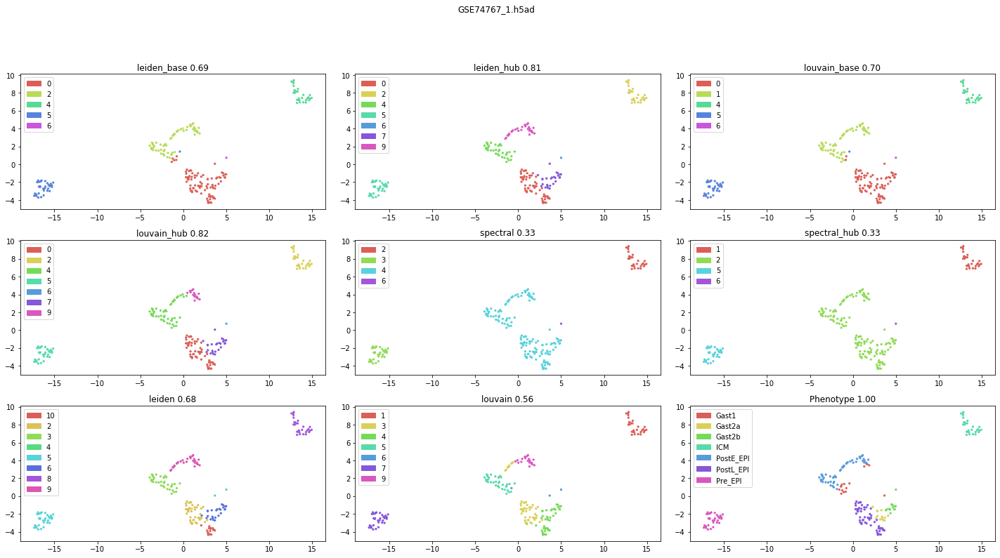

,Base hubness,Reduced hubness
k_skewness,4.38307,1.82957
k_skewness_truncnorm,1.07701,0.653023
atkinson,0.456832,0.149614
gini,0.671481,0.375552
robinhood,0.514727,0.261758
antihubs,"[0, 1, 4, 7, 18, 43, 46, 48, 51, 60, 63, 64, 6...","[0, 46, 64, 68, 72, 88, 93, 139, 250, 269, 270..."
antihub_occurrence,0.275534,0.0570071
hubs,"[9, 12, 13, 21, 23, 25, 31, 34, 35, 36, 37, 40...","[23, 35, 40, 67, 89, 94, 97, 111, 122, 130, 13..."
hub_occurrence,0.653444,0.226841
groupie_ratio,0.0365796,0.0154394




-------------------------------------------------------------------------------------------------------------





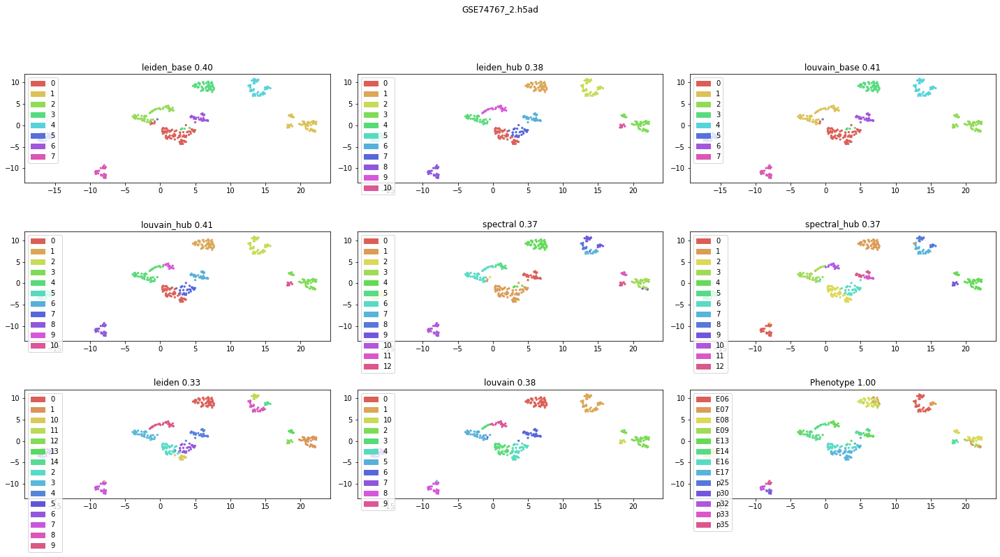

,Base hubness,Reduced hubness
k_skewness,4.38307,1.82957
k_skewness_truncnorm,1.07701,0.653023
atkinson,0.456832,0.149614
gini,0.671481,0.375552
robinhood,0.514727,0.261758
antihubs,"[0, 1, 4, 7, 18, 43, 46, 48, 51, 60, 63, 64, 6...","[0, 46, 64, 68, 72, 88, 93, 139, 250, 269, 270..."
antihub_occurrence,0.275534,0.0570071
hubs,"[9, 12, 13, 21, 23, 25, 31, 34, 35, 36, 37, 40...","[23, 35, 40, 67, 89, 94, 97, 111, 122, 130, 13..."
hub_occurrence,0.653444,0.226841
groupie_ratio,0.0365796,0.0154394




-------------------------------------------------------------------------------------------------------------





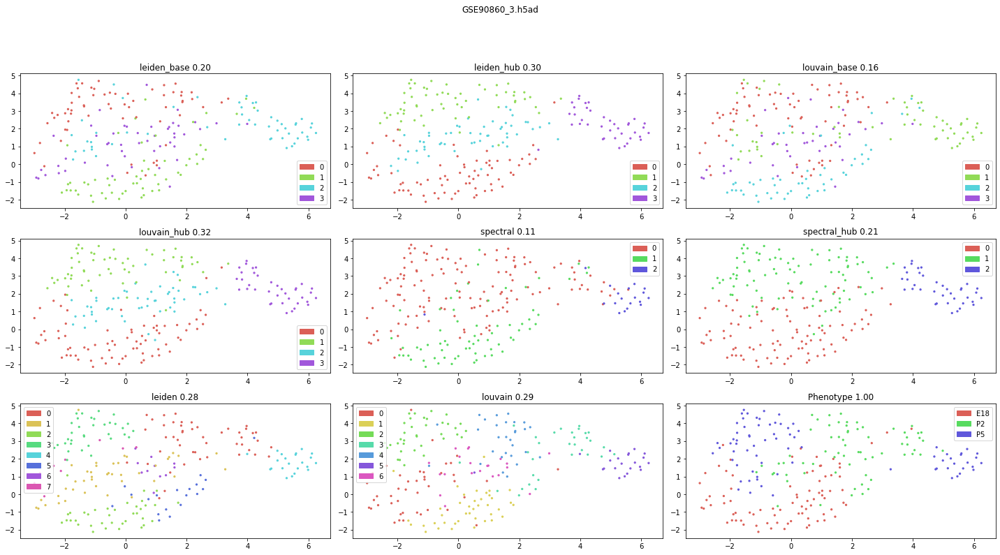

,Base hubness,Reduced hubness
k_skewness,4.23089,1.60534
k_skewness_truncnorm,1.28827,0.8914
atkinson,0.834002,0.298916
gini,0.914046,0.541793
robinhood,0.812556,0.404036
antihubs,"[0, 1, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 1...","[12, 23, 29, 31, 33, 52, 54, 83, 85, 86, 87, 9..."
antihub_occurrence,0.699552,0.147982
hubs,"[2, 35, 55, 56, 59, 62, 64, 67, 70, 73, 76, 77...","[2, 16, 35, 56, 59, 60, 62, 70, 73, 76, 77, 11..."
hub_occurrence,0.900448,0.475785
groupie_ratio,0.0950673,0.026009




-------------------------------------------------------------------------------------------------------------





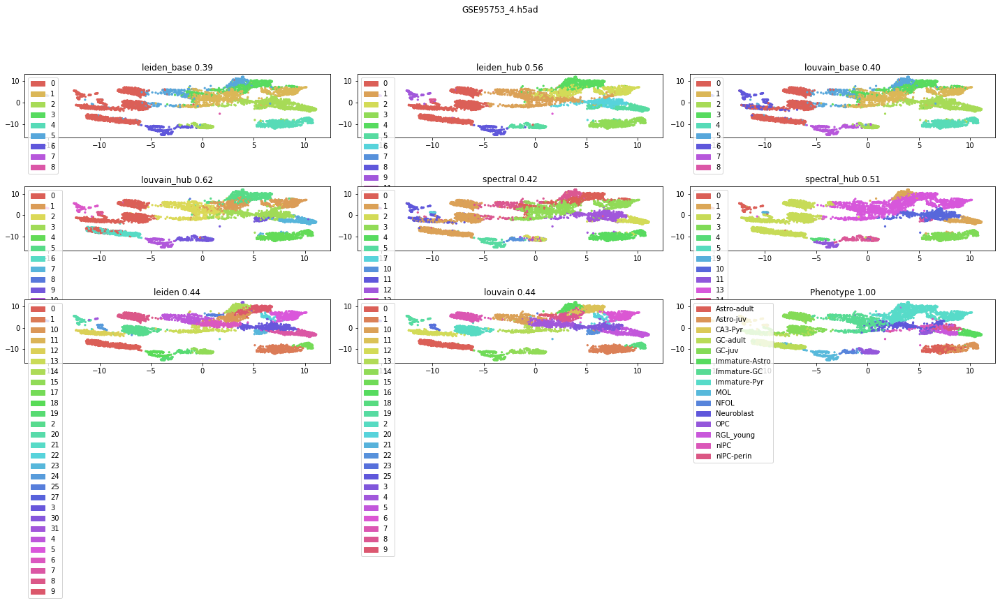

,Base hubness,Reduced hubness
k_skewness,10.2862,4.73508
k_skewness_truncnorm,1.38405,1.15813
atkinson,0.877257,0.597531
gini,0.944139,0.768725
robinhood,0.84315,0.607583
antihubs,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 13, 14, 16,...","[1, 2, 3, 6, 13, 14, 16, 19, 20, 21, 23, 27, 2..."
antihub_occurrence,0.7385,0.43
hubs,"[15, 22, 28, 44, 47, 80, 102, 110, 115, 126, 1...","[5, 10, 11, 12, 15, 17, 22, 25, 26, 28, 32, 44..."
hub_occurrence,0.91345,0.71445
groupie_ratio,0.0199833,0.00493333




-------------------------------------------------------------------------------------------------------------





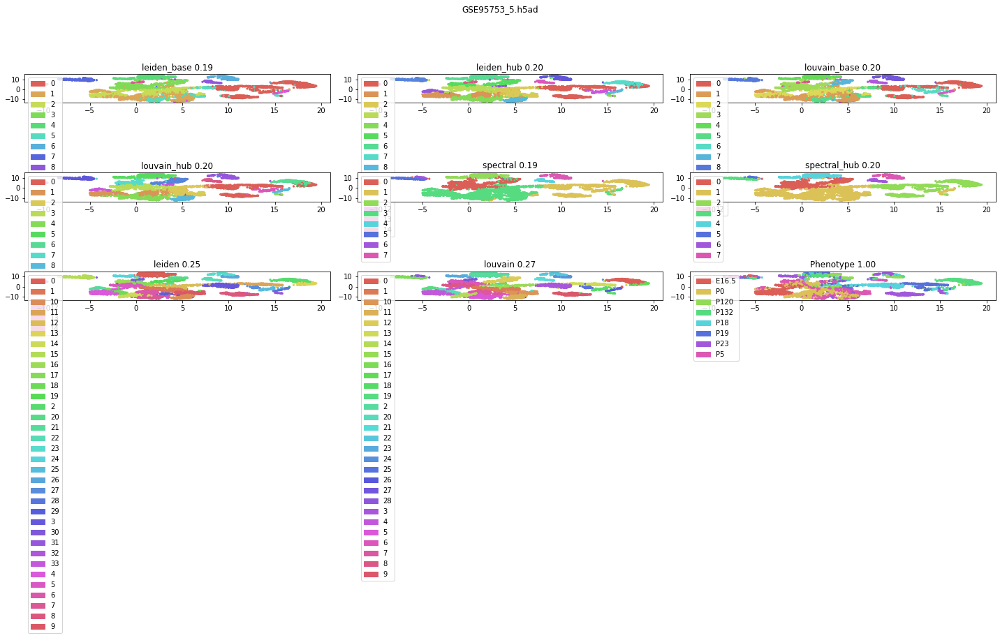

,Base hubness,Reduced hubness
k_skewness,10.4644,4.91701
k_skewness_truncnorm,1.37544,1.1582
atkinson,0.86593,0.584676
gini,0.938427,0.761091
robinhood,0.83305,0.596633
antihubs,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15...","[3, 4, 5, 6, 7, 8, 9, 11, 15, 16, 20, 21, 22, ..."
antihub_occurrence,0.7195,0.413167
hubs,"[0, 18, 34, 35, 60, 64, 75, 89, 99, 101, 115, ...","[18, 19, 33, 34, 35, 49, 60, 64, 68, 69, 72, 7..."
hub_occurrence,0.904683,0.701983
groupie_ratio,0.0191333,0.0046




-------------------------------------------------------------------------------------------------------------





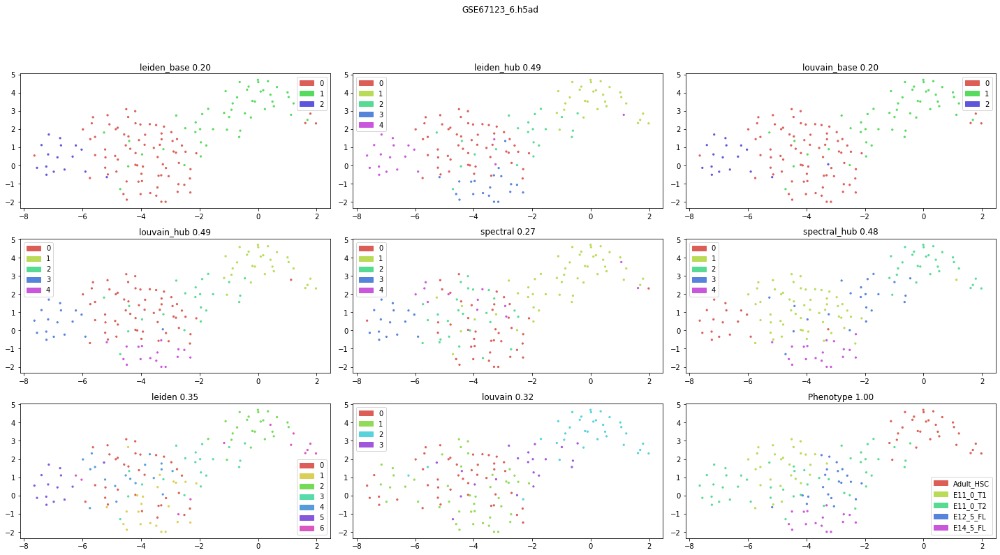

,Base hubness,Reduced hubness
k_skewness,2.21565,1.40436
k_skewness_truncnorm,1.12356,0.742186
atkinson,0.640156,0.177912
gini,0.786875,0.430368
robinhood,0.659441,0.31049
antihubs,"[0, 6, 8, 14, 19, 21, 30, 31, 33, 37, 43, 52, ...","[8, 19, 54, 62, 104, 116, 135]"
antihub_occurrence,0.48951,0.048951
hubs,"[1, 2, 3, 5, 10, 13, 16, 34, 35, 36, 39, 41, 4...","[1, 5, 10, 13, 16, 27, 34, 35, 36, 41, 44, 50,..."
hub_occurrence,0.797902,0.312587
groupie_ratio,0.0587413,0.0286713




-------------------------------------------------------------------------------------------------------------





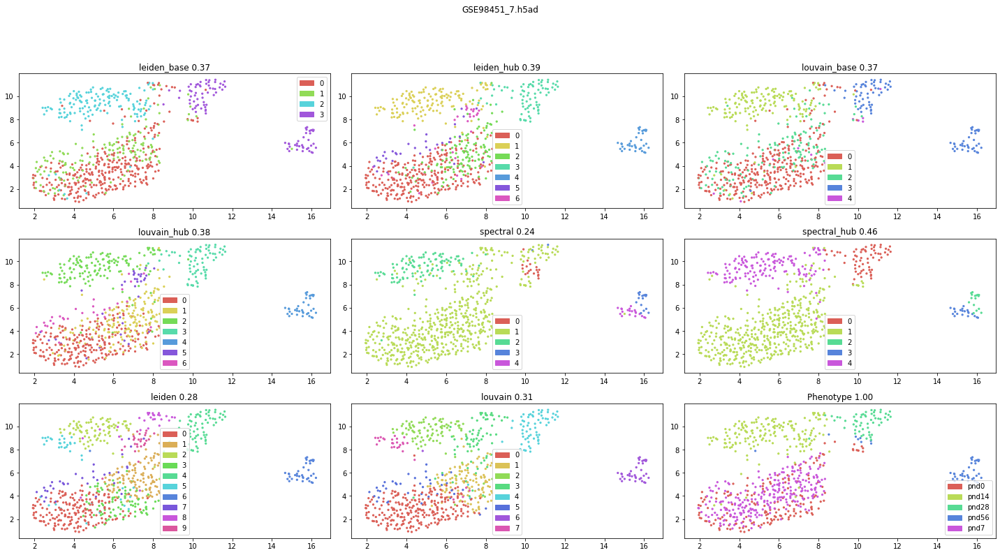

,Base hubness,Reduced hubness
k_skewness,8.49842,3.16617
k_skewness_truncnorm,1.37522,1.04537
atkinson,0.854369,0.417928
gini,0.935446,0.651691
robinhood,0.819468,0.489916
antihubs,"[0, 2, 4, 5, 6, 7, 8, 9, 11, 15, 16, 17, 18, 1...","[0, 2, 6, 7, 15, 16, 17, 18, 19, 29, 30, 36, 4..."
antihub_occurrence,0.676471,0.22409
hubs,"[1, 13, 14, 21, 50, 62, 75, 78, 80, 91, 99, 10...","[1, 13, 21, 33, 42, 50, 52, 53, 62, 75, 80, 91..."
hub_occurrence,0.87591,0.577731
groupie_ratio,0.0819328,0.0168067




-------------------------------------------------------------------------------------------------------------





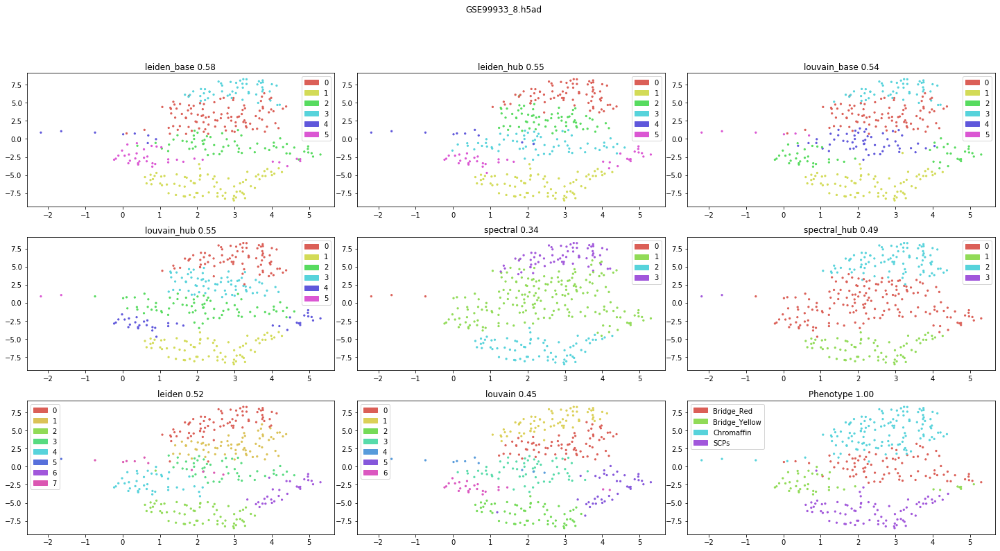

,Base hubness,Reduced hubness
k_skewness,3.9368,2.88658
k_skewness_truncnorm,1.14083,0.913708
atkinson,0.609843,0.278457
gini,0.768674,0.528986
robinhood,0.619241,0.387805
antihubs,"[4, 6, 11, 16, 21, 22, 23, 24, 30, 31, 32, 33,...","[22, 23, 33, 39, 41, 47, 56, 64, 74, 90, 92, 1..."
antihub_occurrence,0.466125,0.119241
hubs,"[0, 12, 13, 15, 20, 27, 29, 36, 51, 59, 76, 81...","[0, 2, 12, 13, 15, 27, 29, 51, 79, 82, 98, 100..."
hub_occurrence,0.741463,0.436856
groupie_ratio,0.0504065,0.0276423




-------------------------------------------------------------------------------------------------------------





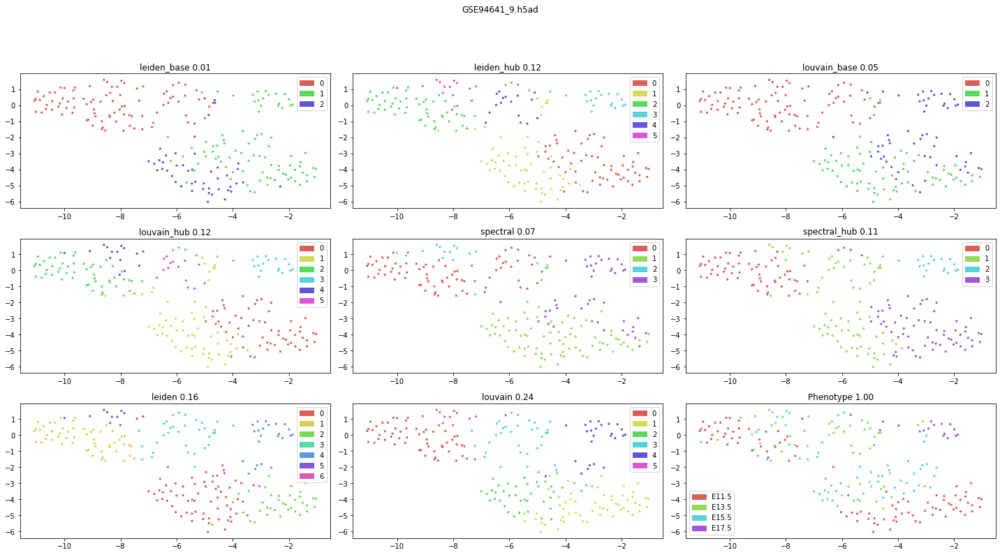

,Base hubness,Reduced hubness
k_skewness,3.07114,1.4933
k_skewness_truncnorm,1.18198,0.797436
atkinson,0.694253,0.210082
gini,0.830554,0.465928
robinhood,0.699111,0.337333
antihubs,"[0, 3, 6, 7, 8, 9, 10, 11, 13, 14, 18, 19, 21,...","[18, 22, 45, 48, 52, 54, 67, 76, 83, 84, 112, ..."
antihub_occurrence,0.528889,0.0711111
hubs,"[1, 2, 20, 31, 37, 38, 55, 61, 64, 88, 90, 104...","[1, 2, 15, 20, 25, 31, 37, 38, 61, 64, 68, 74,..."
hub_occurrence,0.808444,0.350222
groupie_ratio,0.0617778,0.024




-------------------------------------------------------------------------------------------------------------





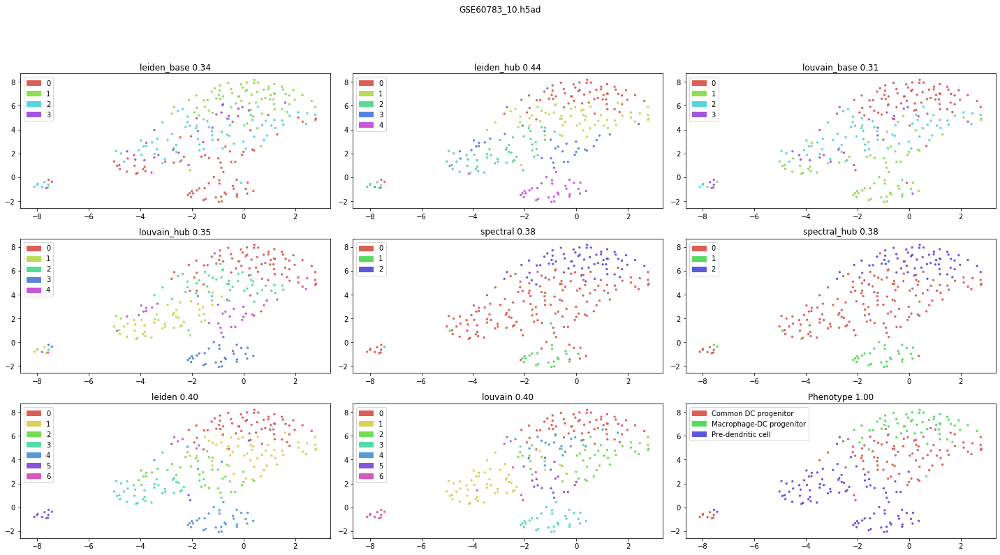

,Base hubness,Reduced hubness
k_skewness,4.53805,1.3404
k_skewness_truncnorm,1.27151,0.816127
atkinson,0.762301,0.24666
gini,0.885471,0.486424
robinhood,0.754032,0.350403
antihubs,"[0, 2, 3, 4, 6, 9, 10, 15, 17, 18, 19, 26, 27,...","[2, 6, 17, 28, 48, 64, 76, 85, 87, 93, 103, 11..."
antihub_occurrence,0.552419,0.112903
hubs,"[5, 13, 14, 21, 23, 25, 32, 43, 44, 46, 53, 65...","[14, 21, 31, 32, 43, 46, 53, 58, 67, 72, 77, 8..."
hub_occurrence,0.839113,0.389516
groupie_ratio,0.091129,0.0189516




-------------------------------------------------------------------------------------------------------------





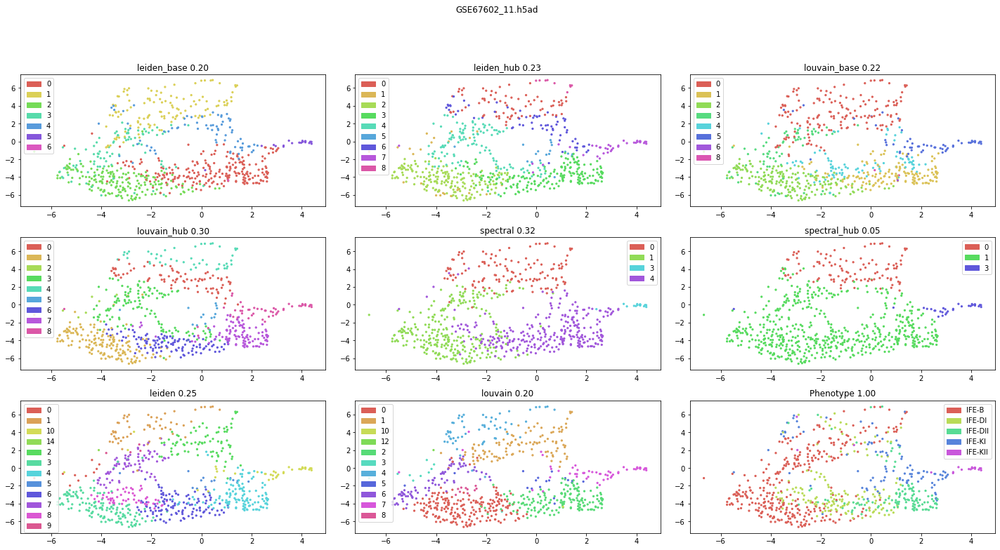

,Base hubness,Reduced hubness
k_skewness,6.13013,3.26808
k_skewness_truncnorm,1.26129,0.970925
atkinson,0.723709,0.356842
gini,0.858526,0.585832
robinhood,0.70872,0.433544
antihubs,"[0, 1, 2, 4, 7, 10, 12, 13, 14, 15, 16, 17, 19...","[7, 13, 34, 38, 42, 47, 48, 53, 61, 65, 66, 70..."
antihub_occurrence,0.538678,0.201828
hubs,"[29, 32, 36, 37, 50, 62, 75, 128, 138, 142, 14...","[5, 6, 11, 19, 29, 31, 32, 35, 37, 44, 46, 50,..."
hub_occurrence,0.789733,0.505274
groupie_ratio,0.0273558,0.011744




-------------------------------------------------------------------------------------------------------------





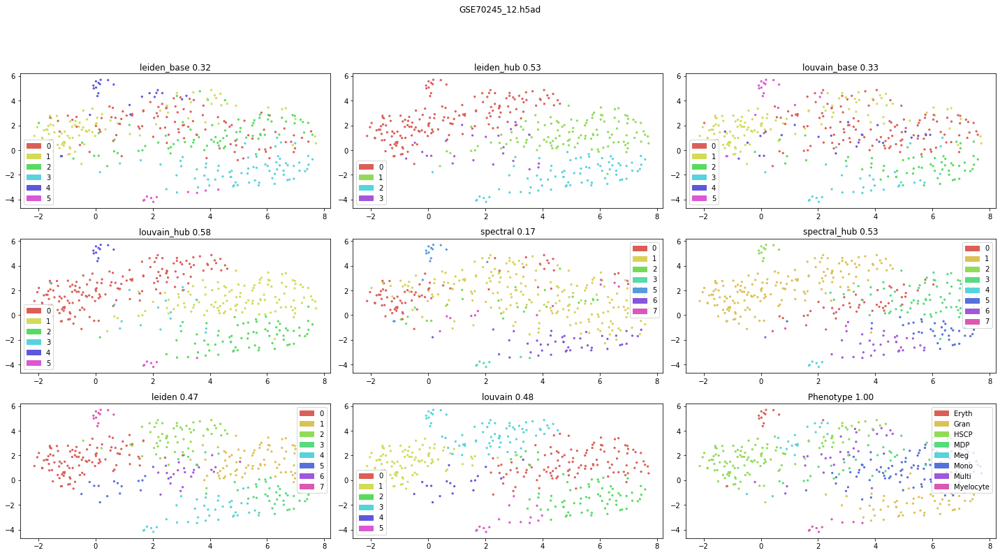

,Base hubness,Reduced hubness
k_skewness,6.27014,2.28397
k_skewness_truncnorm,1.31154,0.980153
atkinson,0.773248,0.366755
gini,0.894536,0.605625
robinhood,0.754315,0.447716
antihubs,"[1, 2, 3, 5, 7, 8, 9, 10, 11, 12, 13, 14, 16, ...","[2, 7, 9, 18, 19, 20, 25, 26, 30, 32, 33, 34, ..."
antihub_occurrence,0.555838,0.187817
hubs,"[24, 47, 50, 52, 55, 72, 97, 102, 116, 118, 12...","[4, 5, 22, 37, 47, 50, 59, 60, 64, 68, 72, 74,..."
hub_occurrence,0.828934,0.529695
groupie_ratio,0.0895939,0.019797




-------------------------------------------------------------------------------------------------------------





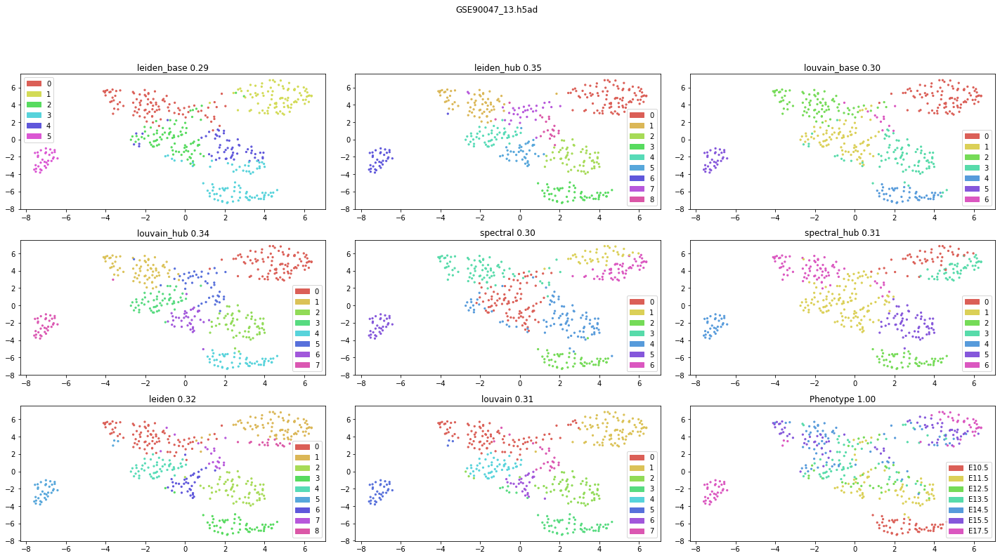

,Base hubness,Reduced hubness
k_skewness,2.14892,1.15967
k_skewness_truncnorm,0.992094,0.613521
atkinson,0.409546,0.13627
gini,0.629738,0.371255
robinhood,0.477629,0.265101
antihubs,"[3, 4, 9, 10, 13, 14, 19, 20, 23, 25, 26, 30, ...","[25, 35, 61, 92, 137, 181, 254, 270, 282, 287,..."
antihub_occurrence,0.255034,0.0357942
hubs,"[17, 18, 21, 27, 29, 47, 48, 53, 65, 66, 69, 7...","[17, 18, 21, 27, 47, 48, 53, 57, 64, 66, 113, ..."
hub_occurrence,0.594855,0.214094
groupie_ratio,0.0183445,0.010962




-------------------------------------------------------------------------------------------------------------





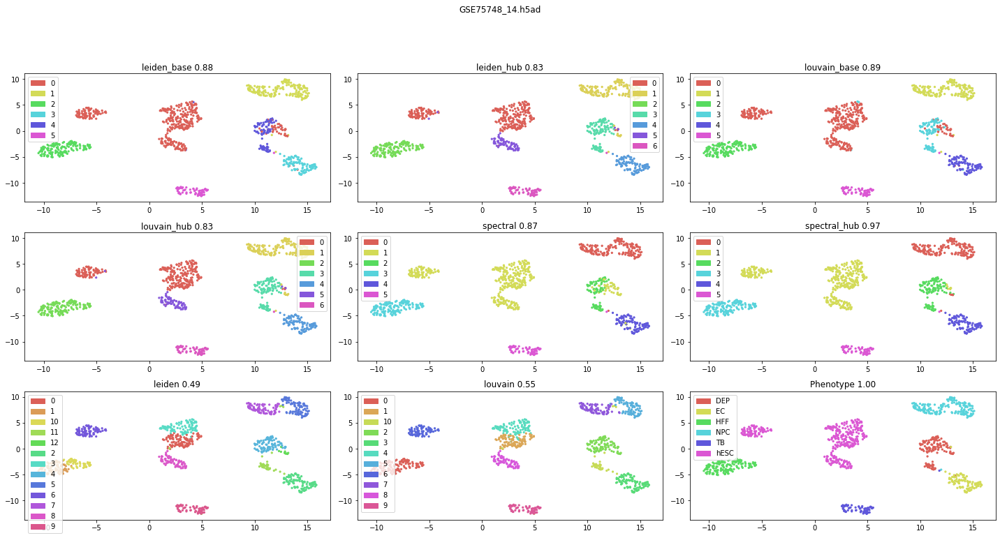

,Base hubness,Reduced hubness
k_skewness,7.32473,3.87124
k_skewness_truncnorm,1.33284,1.09278
atkinson,0.855779,0.495701
gini,0.925438,0.704344
robinhood,0.827701,0.546955
antihubs,"[0, 1, 3, 4, 6, 7, 9, 10, 13, 15, 18, 19, 21, ...","[6, 10, 24, 26, 27, 28, 31, 40, 46, 49, 50, 59..."
antihub_occurrence,0.748527,0.306483
hubs,"[11, 14, 16, 17, 30, 32, 35, 42, 55, 60, 62, 7...","[2, 11, 14, 16, 29, 30, 32, 33, 35, 38, 39, 41..."
hub_occurrence,0.92387,0.688998
groupie_ratio,0.0472495,0.0185658




-------------------------------------------------------------------------------------------------------------





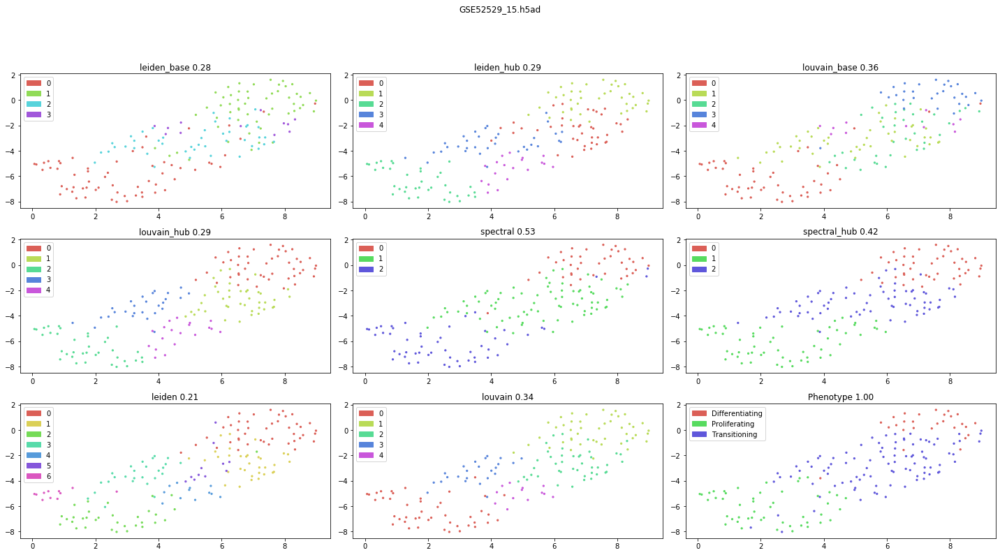

,Base hubness,Reduced hubness
k_skewness,2.83043,1.03489
k_skewness_truncnorm,1.14876,0.831194
atkinson,0.679245,0.273305
gini,0.804533,0.511024
robinhood,0.676471,0.388235
antihubs,"[0, 3, 4, 6, 7, 15, 19, 21, 22, 28, 29, 30, 33...","[3, 4, 15, 28, 34, 51, 70, 73, 76, 78, 82, 91,..."
antihub_occurrence,0.564706,0.135294
hubs,"[1, 2, 5, 9, 10, 14, 16, 18, 20, 23, 26, 31, 3...","[2, 5, 9, 10, 14, 18, 20, 23, 32, 37, 41, 53, ..."
hub_occurrence,0.831765,0.485294
groupie_ratio,0.0729412,0.0276471




-------------------------------------------------------------------------------------------------------------





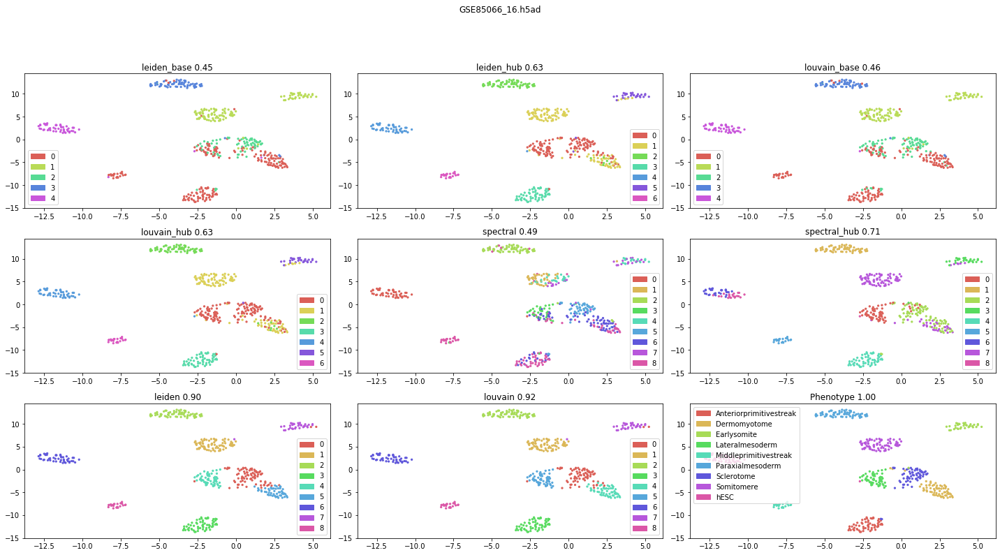

,Base hubness,Reduced hubness
k_skewness,6.10084,2.468
k_skewness_truncnorm,1.30735,1.07331
atkinson,0.834737,0.53336
gini,0.914799,0.719859
robinhood,0.821888,0.578514
antihubs,"[0, 1, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 15, 1...","[0, 1, 3, 8, 10, 12, 13, 19, 22, 23, 26, 28, 2..."
antihub_occurrence,0.700803,0.365462
hubs,"[6, 20, 32, 48, 51, 56, 63, 64, 66, 76, 78, 82...","[6, 17, 18, 33, 43, 51, 56, 58, 61, 63, 64, 66..."
hub_occurrence,0.93253,0.710843
groupie_ratio,0.074498,0.0208835




-------------------------------------------------------------------------------------------------------------





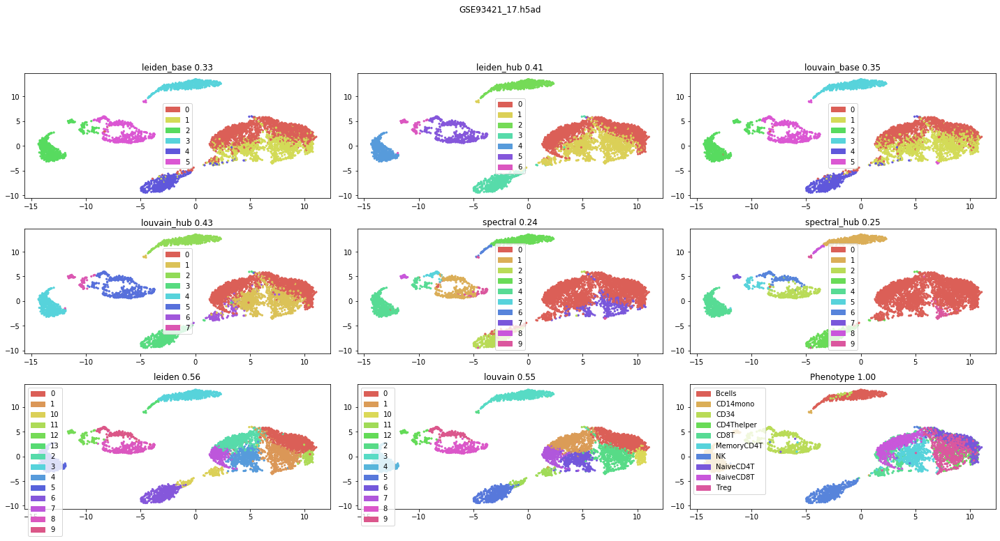

,Base hubness,Reduced hubness
k_skewness,15.6531,6.22203
k_skewness_truncnorm,1.41128,1.19444
atkinson,0.885142,0.620094
gini,0.94886,0.789261
robinhood,0.84694,0.62726
antihubs,"[1, 4, 6, 7, 8, 9, 12, 14, 15, 16, 18, 19, 20,...","[6, 7, 8, 9, 12, 14, 28, 30, 34, 36, 41, 42, 4..."
antihub_occurrence,0.7432,0.4364
hubs,"[0, 11, 59, 63, 100, 129, 137, 148, 157, 165, ...","[0, 3, 5, 10, 11, 13, 25, 43, 58, 63, 68, 80, ..."
hub_occurrence,0.91094,0.73048
groupie_ratio,0.0402,0.00964




-------------------------------------------------------------------------------------------------------------





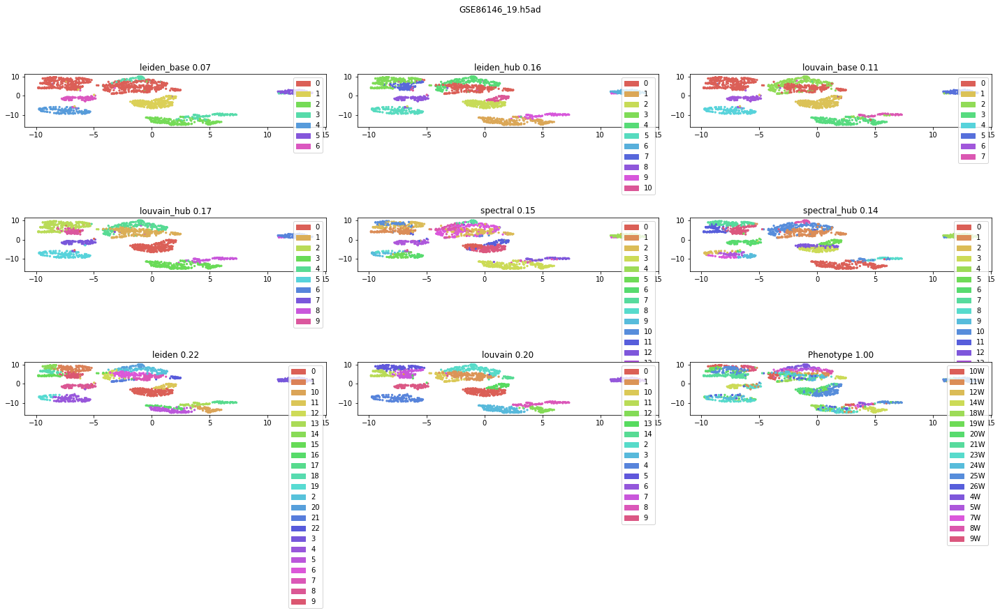

,Base hubness,Reduced hubness
k_skewness,10.3211,3.61255
k_skewness_truncnorm,1.35267,1.04207
atkinson,0.835715,0.453745
gini,0.920653,0.653839
robinhood,0.805369,0.494848
antihubs,"[0, 1, 2, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, ...","[0, 2, 5, 10, 13, 16, 17, 18, 19, 20, 21, 23, ..."
antihub_occurrence,0.687636,0.307484
hubs,"[4, 58, 82, 165, 171, 173, 175, 197, 198, 204,...","[3, 4, 9, 30, 33, 45, 46, 51, 56, 58, 59, 62, ..."
hub_occurrence,0.891432,0.588395
groupie_ratio,0.0491866,0.00900217




-------------------------------------------------------------------------------------------------------------





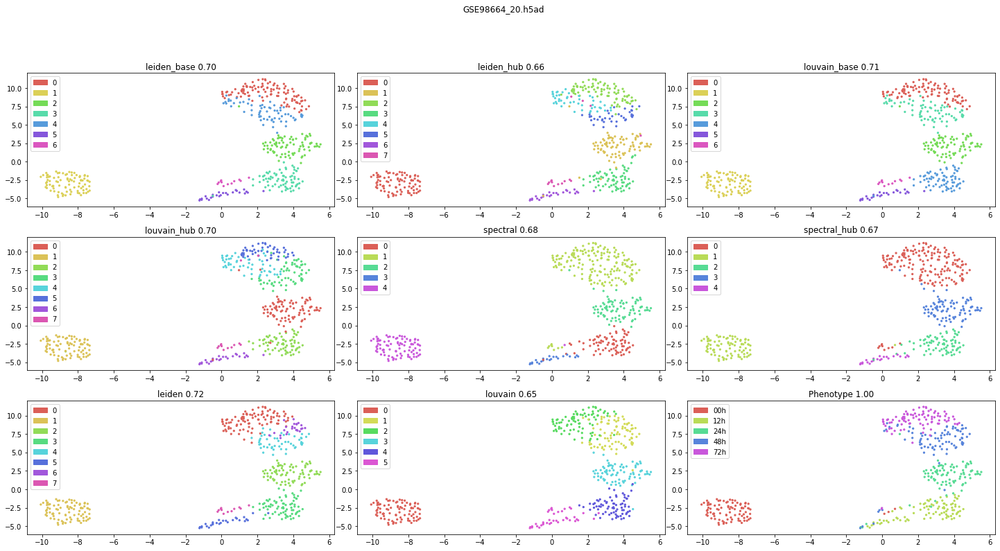

,Base hubness,Reduced hubness
k_skewness,2.35589,1.00874
k_skewness_truncnorm,0.97227,0.483297
atkinson,0.330837,0.089072
gini,0.590936,0.320935
robinhood,0.44057,0.230482
antihubs,"[2, 14, 18, 20, 23, 40, 42, 43, 44, 52, 56, 57...","[52, 214, 300]"
antihub_occurrence,0.133772,0.00657895
hubs,"[22, 28, 32, 38, 54, 58, 63, 64, 65, 74, 84, 8...","[22, 38, 54, 58, 65, 74, 85, 88, 106, 121, 137..."
hub_occurrence,0.533333,0.147588
groupie_ratio,0.020614,0.00745614




-------------------------------------------------------------------------------------------------------------





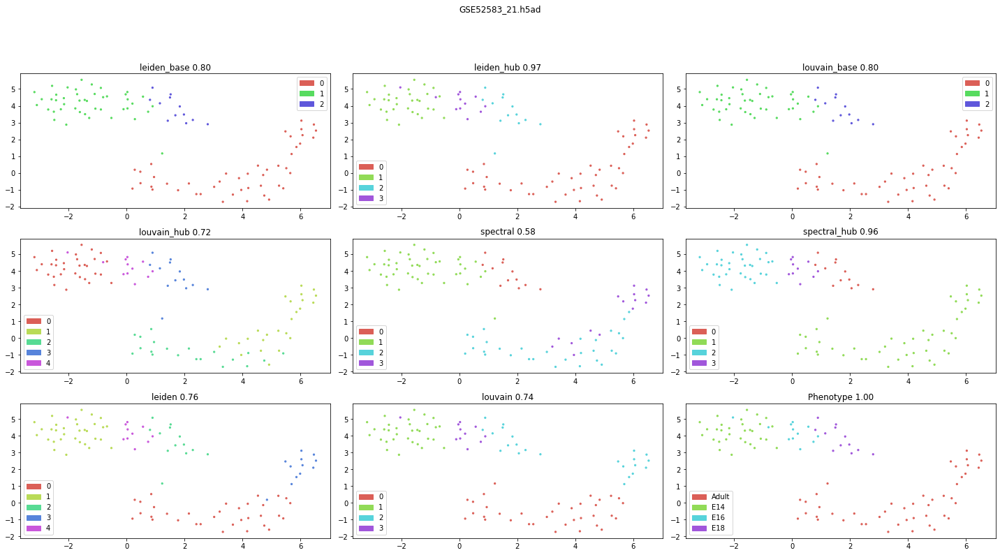

,Base hubness,Reduced hubness
k_skewness,1.39019,1.1915
k_skewness_truncnorm,1.02243,0.654667
atkinson,0.52069,0.135596
gini,0.691913,0.384531
robinhood,0.558416,0.269307
antihubs,"[3, 6, 7, 14, 18, 19, 20, 21, 24, 29, 33, 34, ...","[18, 21, 36]"
antihub_occurrence,0.376238,0.029703
hubs,"[12, 13, 15, 16, 22, 23, 26, 27, 28, 31, 37, 4...","[22, 23, 27, 28, 42, 44, 60, 64, 67, 68]"
hub_occurrence,0.755446,0.261386
groupie_ratio,0.0524752,0.0326733




-------------------------------------------------------------------------------------------------------------





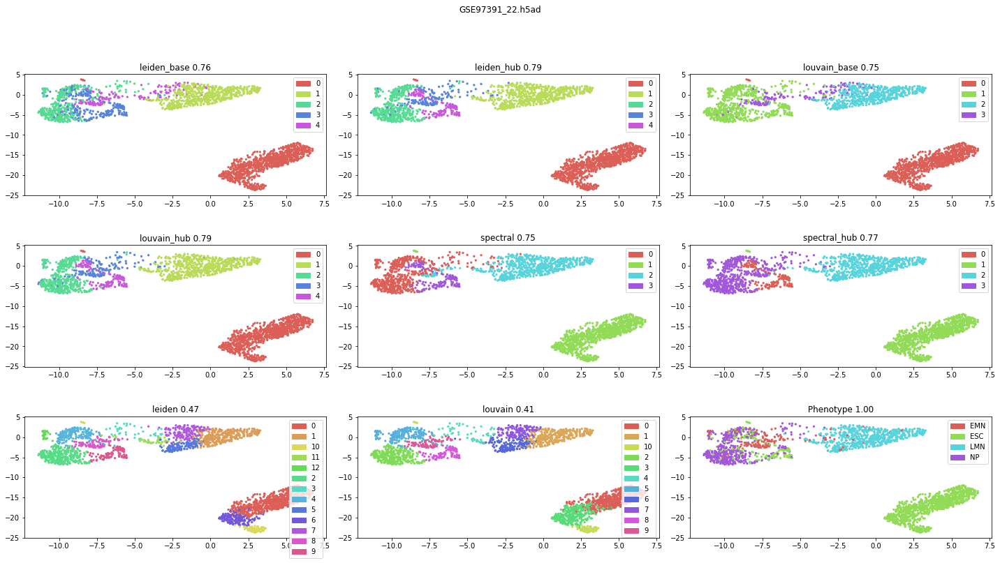

,Base hubness,Reduced hubness
k_skewness,9.79258,7.43847
k_skewness_truncnorm,1.38961,1.17927
atkinson,0.878781,0.606752
gini,0.947293,0.774891
robinhood,0.845976,0.618741
antihubs,"[26, 30, 33, 34, 36, 37, 41, 43, 46, 49, 52, 5...","[36, 46, 61, 90, 96, 120, 122, 135, 150, 161, ..."
antihub_occurrence,0.718331,0.434799
hubs,"[0, 1, 2, 3, 4, 5, 6, 7, 10, 11, 12, 13, 15, 1...","[0, 1, 2, 3, 4, 5, 6, 7, 10, 11, 12, 15, 16, 1..."
hub_occurrence,0.909203,0.724367
groupie_ratio,0.0359911,0.0163934




-------------------------------------------------------------------------------------------------------------





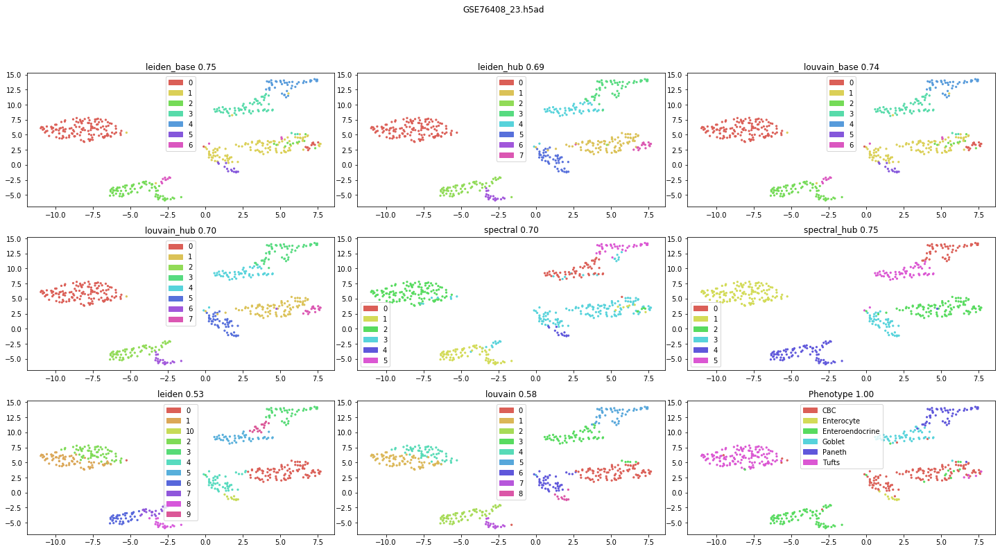

,Base hubness,Reduced hubness
k_skewness,4.38326,1.77896
k_skewness_truncnorm,1.22321,0.828003
atkinson,0.709758,0.252193
gini,0.846354,0.485391
robinhood,0.701042,0.351875
antihubs,"[0, 1, 4, 6, 7, 8, 9, 11, 14, 16, 19, 20, 21, ...","[4, 8, 9, 42, 46, 67, 68, 77, 79, 97, 98, 103,..."
antihub_occurrence,0.5375,0.129167
hubs,"[15, 41, 47, 55, 57, 59, 60, 62, 65, 69, 72, 7...","[10, 12, 13, 17, 18, 23, 33, 41, 53, 55, 59, 6..."
hub_occurrence,0.785208,0.381042
groupie_ratio,0.0502083,0.015




-------------------------------------------------------------------------------------------------------------





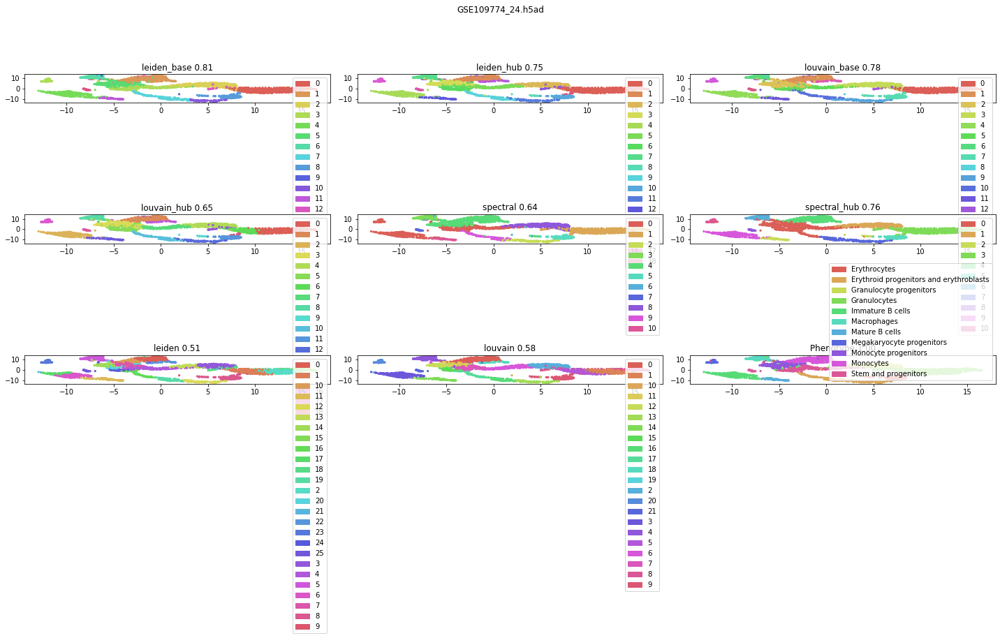

,Base hubness,Reduced hubness
k_skewness,5.51767,3.35834
k_skewness_truncnorm,1.23176,0.959244
atkinson,0.691011,0.322406
gini,0.836335,0.561856
robinhood,0.684091,0.410104
antihubs,"[1, 4, 6, 8, 13, 14, 18, 19, 27, 28, 29, 35, 3...","[1, 6, 8, 35, 36, 39, 47, 56, 64, 74, 78, 80, ..."
antihub_occurrence,0.510405,0.165115
hubs,"[2, 12, 20, 21, 26, 30, 41, 43, 57, 63, 69, 89...","[2, 7, 11, 12, 20, 21, 22, 32, 41, 43, 54, 62,..."
hub_occurrence,0.793729,0.45356
groupie_ratio,0.0109255,0.0043264




-------------------------------------------------------------------------------------------------------------





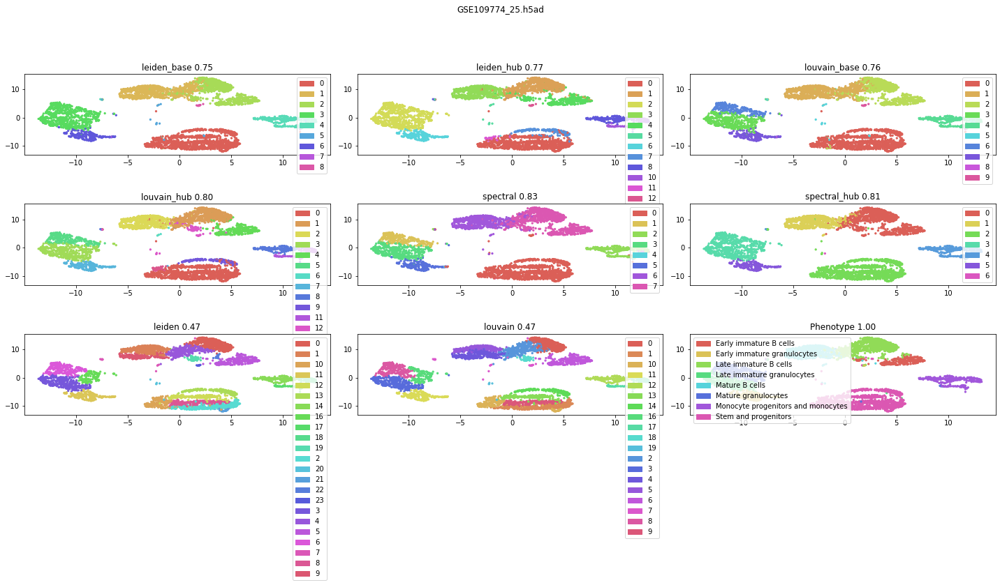

,Base hubness,Reduced hubness
k_skewness,10.1481,6.56617
k_skewness_truncnorm,1.37556,1.16187
atkinson,0.872022,0.567414
gini,0.939689,0.744551
robinhood,0.837574,0.577946
antihubs,"[0, 2, 3, 6, 7, 8, 9, 10, 11, 13, 15, 16, 17, ...","[2, 9, 11, 17, 22, 23, 28, 33, 34, 36, 38, 39,..."
antihub_occurrence,0.744333,0.401879
hubs,"[72, 93, 168, 185, 201, 208, 231, 236, 265, 27...","[1, 4, 12, 18, 19, 25, 26, 29, 43, 61, 68, 74,..."
hub_occurrence,0.908781,0.674311
groupie_ratio,0.0200327,0.00710639




-------------------------------------------------------------------------------------------------------------





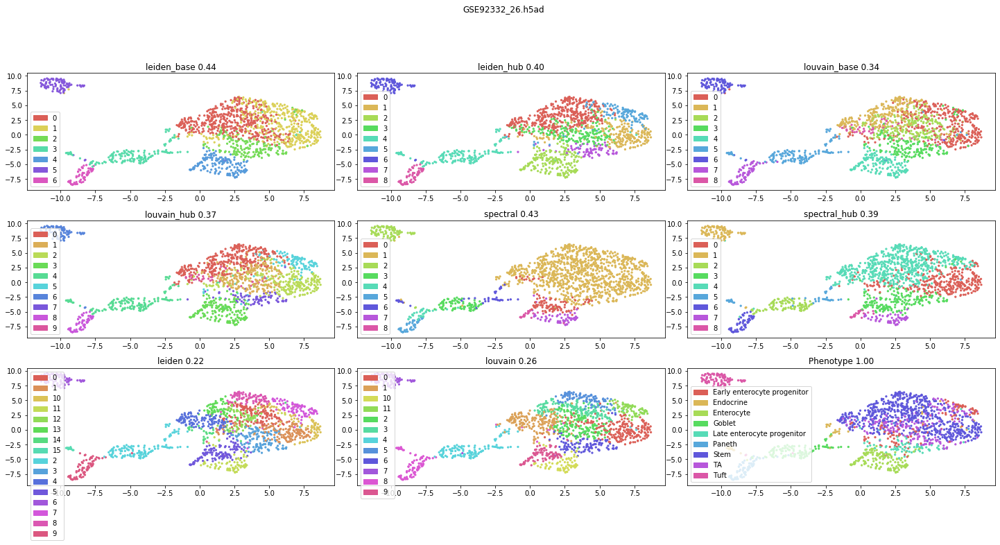

,Base hubness,Reduced hubness
k_skewness,9.68868,5.43708
k_skewness_truncnorm,1.32698,1.04468
atkinson,0.770564,0.400883
gini,0.887974,0.623172
robinhood,0.742116,0.459987
antihubs,"[2, 3, 5, 6, 10, 11, 13, 14, 16, 19, 21, 22, 2...","[10, 14, 16, 19, 23, 30, 31, 35, 36, 60, 63, 7..."
antihub_occurrence,0.580815,0.238502
hubs,"[0, 7, 8, 12, 15, 27, 29, 37, 41, 42, 50, 52, ...","[0, 1, 7, 8, 12, 15, 18, 21, 25, 32, 37, 40, 5..."
hub_occurrence,0.820499,0.541196
groupie_ratio,0.049343,0.0166229




-------------------------------------------------------------------------------------------------------------





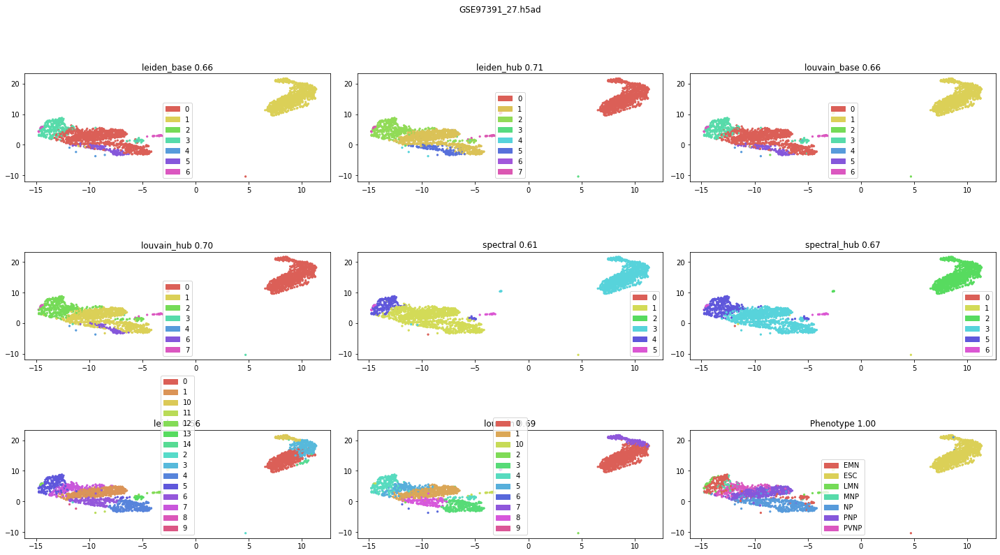

,Base hubness,Reduced hubness
k_skewness,10.1387,6.73017
k_skewness_truncnorm,1.39602,1.19342
atkinson,0.884791,0.62384
gini,0.949661,0.789919
robinhood,0.850768,0.630407
antihubs,"[24, 30, 31, 33, 34, 38, 40, 43, 45, 48, 53, 5...","[33, 43, 56, 83, 89, 114, 127, 153, 164, 175, ..."
antihub_occurrence,0.733311,0.44526
hubs,"[0, 1, 2, 3, 4, 5, 6, 7, 10, 11, 12, 13, 14, 1...","[0, 1, 2, 3, 4, 5, 6, 7, 10, 11, 12, 13, 14, 1..."
hub_occurrence,0.914619,0.742891
groupie_ratio,0.0320427,0.0143525




-------------------------------------------------------------------------------------------------------------





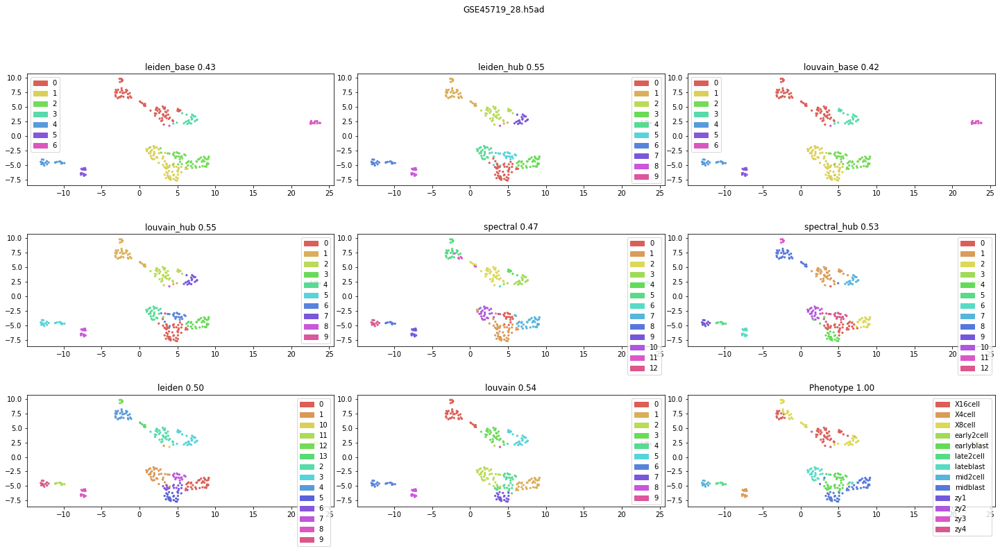

,Base hubness,Reduced hubness
k_skewness,2.55605,1.51851
k_skewness_truncnorm,1.09389,0.699785
atkinson,0.564501,0.18754
gini,0.733733,0.402516
robinhood,0.567483,0.279021
antihubs,"[0, 1, 2, 3, 5, 6, 8, 9, 11, 13, 15, 16, 17, 2...","[15, 17, 24, 32, 45, 101, 103, 114, 116, 117, ..."
antihub_occurrence,0.426573,0.101399
hubs,"[22, 35, 41, 48, 67, 68, 69, 70, 80, 83, 84, 9...","[4, 22, 26, 35, 40, 41, 48, 68, 69, 80, 83, 84..."
hub_occurrence,0.658042,0.265035
groupie_ratio,0.0328671,0.0195804




-------------------------------------------------------------------------------------------------------------





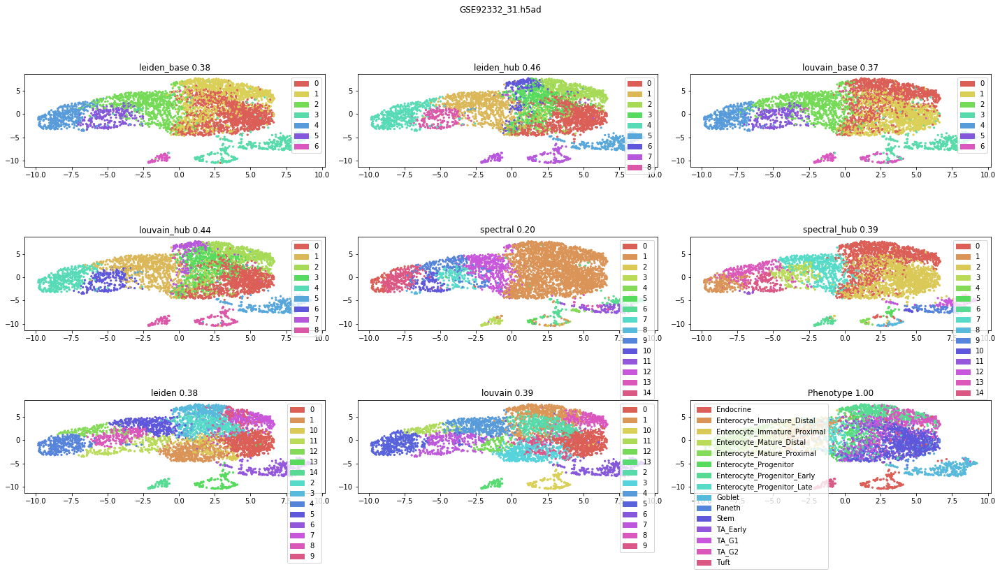

,Base hubness,Reduced hubness
k_skewness,18.3269,4.90807
k_skewness_truncnorm,1.42104,1.16798
atkinson,0.866411,0.603489
gini,0.940988,0.775427
robinhood,0.823859,0.614516
antihubs,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14,...","[1, 3, 6, 7, 8, 11, 12, 14, 17, 18, 19, 20, 21..."
antihub_occurrence,0.697009,0.428946
hubs,"[13, 47, 74, 99, 131, 181, 191, 207, 244, 259,...","[22, 47, 48, 53, 63, 68, 74, 81, 83, 99, 108, ..."
hub_occurrence,0.883301,0.720803
groupie_ratio,0.0490068,0.00637415




-------------------------------------------------------------------------------------------------------------





IndexError: index 5998 is out of bounds for axis 0 with size 5998

In [3]:
rootdir = '../data/Cytotrace_datasets/anndata/'
resdir = '../results/Cytotrace_datasets/'

fnames = np.array(os.listdir(rootdir))
sort_fnames = np.argsort(list(map(lambda fname : int(fname.split('_')[1].split('.')[0]),fnames)))
sorted_fnames = fnames[sort_fnames]

for data_idx in range(len(sorted_fnames)):
    print(data_idx,end='\r')
    try:
        adata = sc.read(resdir+sorted_fnames[data_idx]) 
    except:
        continue
        
    retainedcells_idx = np.where(np.isin(adata.uns['allcellnames'],adata.uns['cellnames']))[0] if data_idx not in [0,29,32] else range(len(adata.X))

    clustering_analysis(adata,retainedcells_idx,plot_title=sorted_fnames[data_idx])
    
    adata.write(resdir+sorted_fnames[data_idx])
    %xdel adata
    gc.collect()
    
    print("\n\n-------------------------------------------------------------------------------------------------------------\n\n\n")

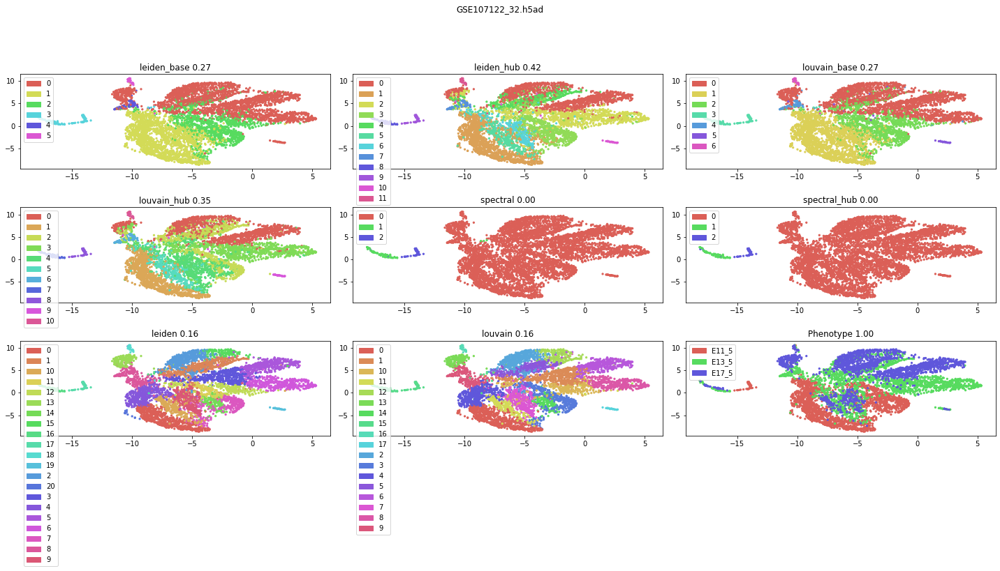

,Base hubness,Reduced hubness
k_skewness,18.3762,5.47558
k_skewness_truncnorm,1.49087,1.28467
atkinson,0.962983,0.799758
gini,0.986335,0.898189
robinhood,0.92876,0.778876
antihubs,"[38, 59, 60, 68, 83, 86, 89, 95, 96, 104, 109,...","[225, 274, 277, 278, 296, 315, 317, 318, 336, ..."
antihub_occurrence,0.863454,0.651717
hubs,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
hub_occurrence,0.955535,0.873041
groupie_ratio,0.0485829,0.00710237




-------------------------------------------------------------------------------------------------------------





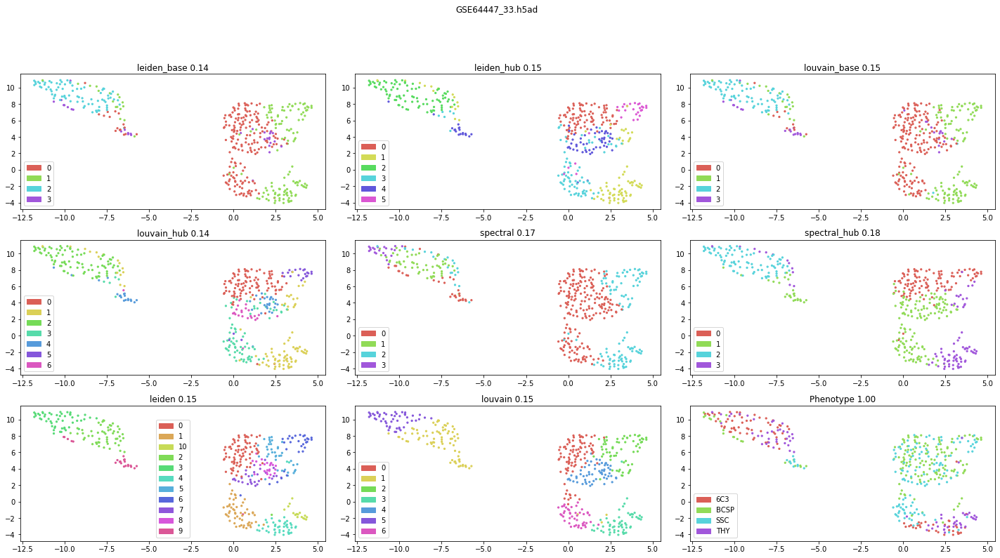

,Base hubness,Reduced hubness
k_skewness,5.3327,2.2293
k_skewness_truncnorm,1.21132,0.896934
atkinson,0.553779,0.244192
gini,0.770936,0.513887
robinhood,0.601566,0.371141
antihubs,"[5, 7, 23, 27, 40, 47, 51, 52, 57, 59, 62, 63,...","[50, 51, 87, 89, 142, 151, 169, 188, 199, 208,..."
antihub_occurrence,0.266219,0.0715884
hubs,"[1, 2, 6, 9, 11, 13, 21, 29, 34, 39, 53, 54, 6...","[0, 1, 4, 6, 8, 11, 13, 15, 18, 20, 24, 26, 29..."
hub_occurrence,0.679866,0.410738
groupie_ratio,0.0501119,0.0154362




-------------------------------------------------------------------------------------------------------------





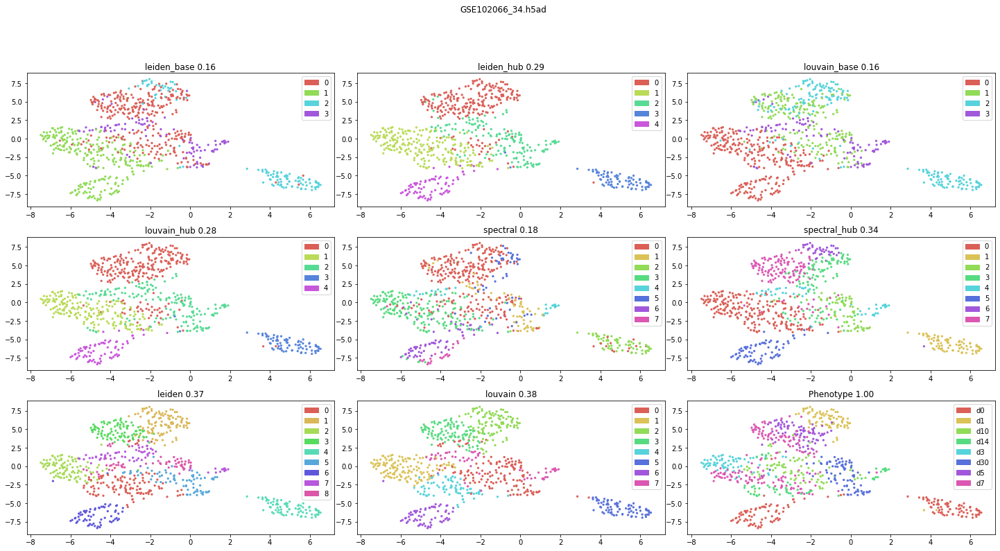

,Base hubness,Reduced hubness
k_skewness,7.49954,2.53
k_skewness_truncnorm,1.34421,1.06441
atkinson,0.850318,0.523615
gini,0.929301,0.708956
robinhood,0.822919,0.55621
antihubs,"[0, 1, 2, 3, 4, 5, 6, 7, 9, 12, 13, 14, 15, 16...","[0, 1, 2, 4, 6, 7, 13, 14, 20, 24, 25, 27, 30,..."
antihub_occurrence,0.701665,0.364917
hubs,"[10, 17, 21, 33, 36, 42, 56, 83, 85, 88, 93, 9...","[8, 10, 17, 32, 33, 34, 35, 36, 38, 39, 42, 56..."
hub_occurrence,0.90589,0.698335
groupie_ratio,0.06863,0.0151088




-------------------------------------------------------------------------------------------------------------





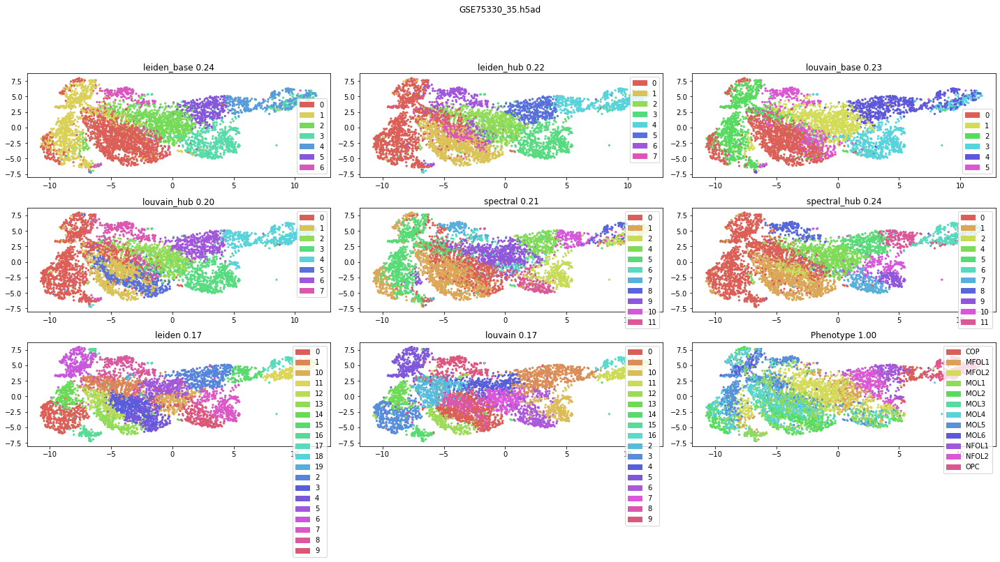

,Base hubness,Reduced hubness
k_skewness,13.603,5.9249
k_skewness_truncnorm,1.42287,1.22596
atkinson,0.925608,0.724214
gini,0.96623,0.846587
robinhood,0.896515,0.713208
antihubs,"[0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14...","[0, 1, 2, 3, 4, 8, 9, 10, 12, 13, 14, 15, 17, ..."
antihub_occurrence,0.829505,0.583366
hubs,"[125, 166, 190, 195, 230, 271, 312, 330, 333, ...","[7, 16, 31, 37, 40, 47, 48, 100, 107, 114, 115..."
hub_occurrence,0.949406,0.833901
groupie_ratio,0.034,0.0103762




-------------------------------------------------------------------------------------------------------------





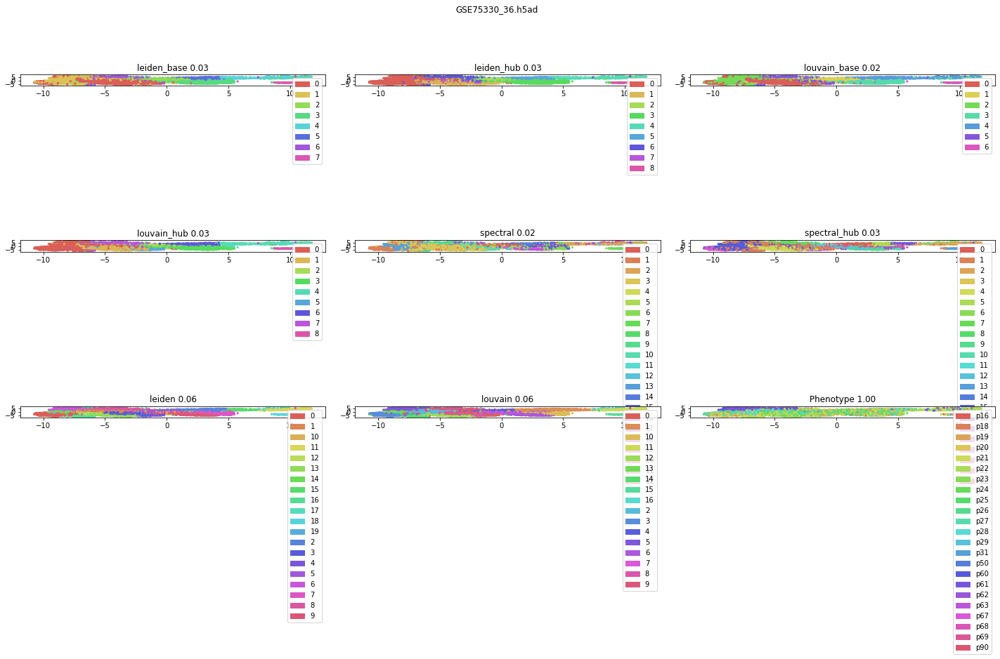

,Base hubness,Reduced hubness
k_skewness,13.603,5.9249
k_skewness_truncnorm,1.42287,1.22596
atkinson,0.925608,0.724214
gini,0.96623,0.846587
robinhood,0.896515,0.713208
antihubs,"[0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14...","[0, 1, 2, 3, 4, 8, 9, 10, 12, 13, 14, 15, 17, ..."
antihub_occurrence,0.829505,0.583366
hubs,"[125, 166, 190, 195, 230, 271, 312, 330, 333, ...","[7, 16, 31, 37, 40, 47, 48, 100, 107, 114, 115..."
hub_occurrence,0.949406,0.833901
groupie_ratio,0.034,0.0103762




-------------------------------------------------------------------------------------------------------------





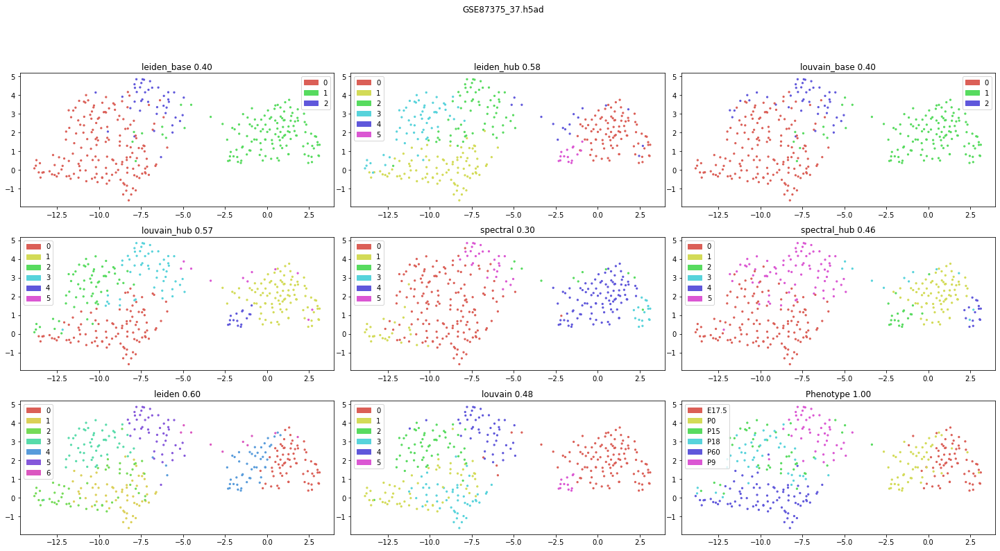

,Base hubness,Reduced hubness
k_skewness,4.15018,2.93967
k_skewness_truncnorm,1.28652,1.08954
atkinson,0.837664,0.487379
gini,0.914084,0.707563
robinhood,0.818343,0.547633
antihubs,"[0, 1, 2, 3, 5, 6, 8, 9, 10, 11, 12, 13, 14, 1...","[0, 2, 3, 11, 13, 14, 22, 28, 29, 39, 60, 61, ..."
antihub_occurrence,0.721893,0.281065
hubs,"[4, 24, 32, 33, 38, 44, 51, 59, 63, 87, 97, 98...","[4, 7, 19, 24, 31, 33, 34, 38, 44, 47, 48, 51,..."
hub_occurrence,0.904734,0.670118
groupie_ratio,0.0683432,0.0310651




-------------------------------------------------------------------------------------------------------------





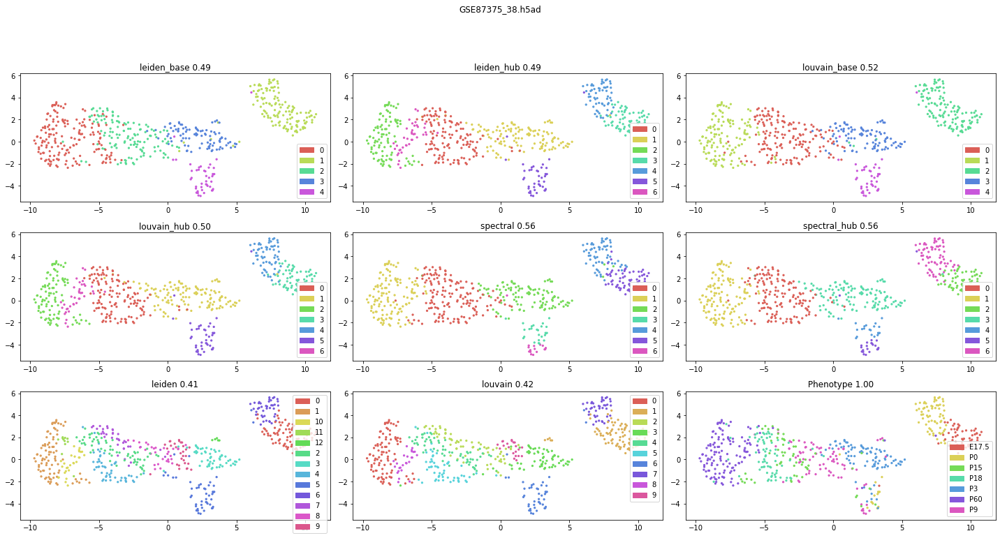

,Base hubness,Reduced hubness
k_skewness,5.97355,3.84679
k_skewness_truncnorm,1.25952,1.0017
atkinson,0.70046,0.320416
gini,0.844842,0.578513
robinhood,0.682783,0.421043
antihubs,"[0, 2, 4, 6, 8, 9, 10, 12, 14, 15, 16, 17, 18,...","[16, 34, 36, 46, 48, 49, 65, 73, 92, 103, 104,..."
antihub_occurrence,0.513043,0.126957
hubs,"[1, 3, 28, 32, 37, 42, 47, 51, 52, 58, 60, 68,...","[1, 7, 13, 21, 25, 28, 32, 35, 37, 42, 47, 59,..."
hub_occurrence,0.765043,0.492348
groupie_ratio,0.0507826,0.0241739




-------------------------------------------------------------------------------------------------------------





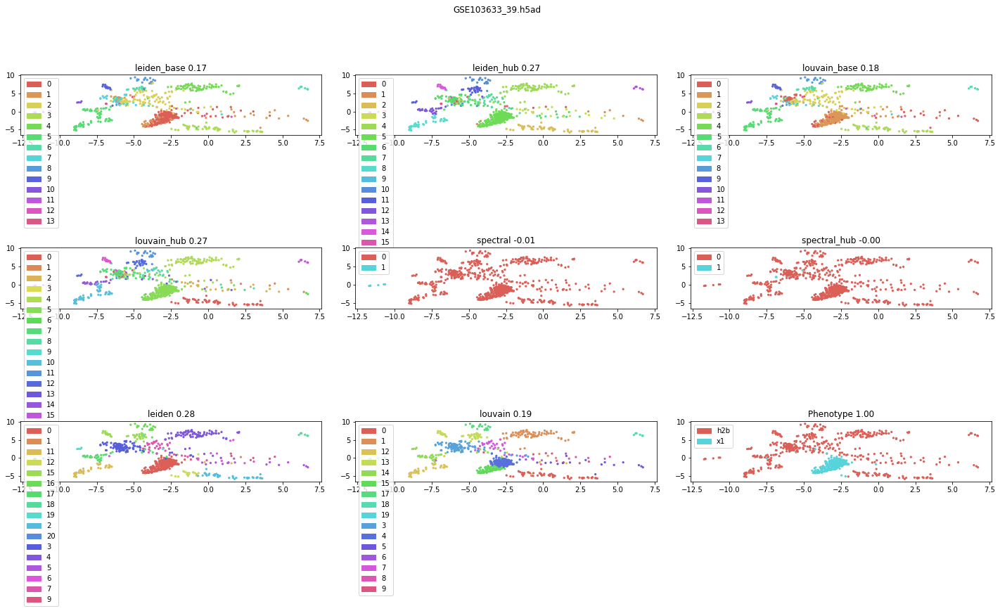

,Base hubness,Reduced hubness
k_skewness,14.109,3.85512
k_skewness_truncnorm,1.37776,1.06349
atkinson,0.797301,0.427672
gini,0.909639,0.661663
robinhood,0.770783,0.498067
antihubs,"[0, 2, 3, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, ...","[1, 3, 14, 16, 17, 22, 25, 26, 29, 33, 34, 39,..."
antihub_occurrence,0.557667,0.224167
hubs,"[6, 30, 42, 47, 48, 75, 91, 131, 134, 140, 149...","[30, 38, 42, 45, 47, 49, 53, 60, 80, 87, 101, ..."
hub_occurrence,0.838517,0.582733
groupie_ratio,0.0240667,0.00395




-------------------------------------------------------------------------------------------------------------





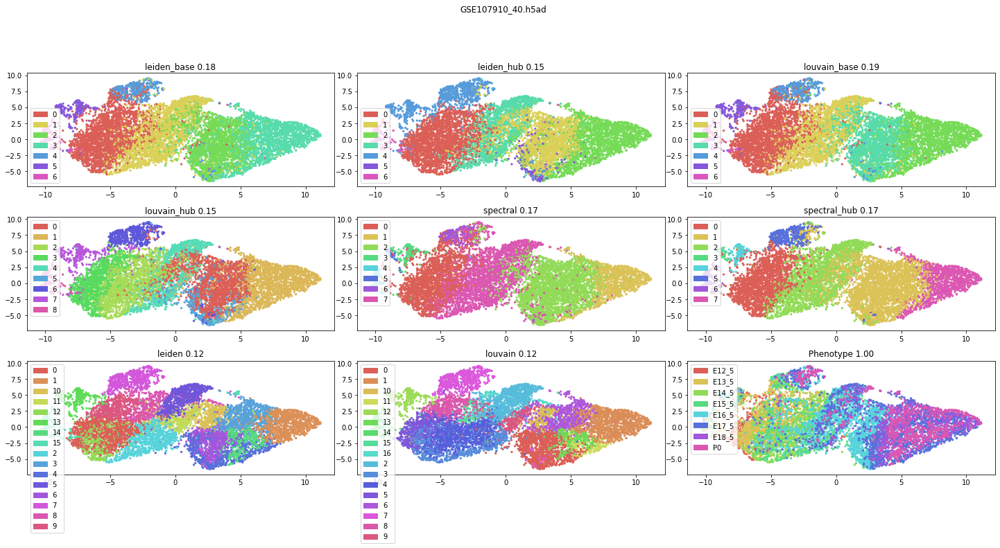

,Base hubness,Reduced hubness
k_skewness,22.6562,8.14658
k_skewness_truncnorm,1.50211,1.33414
atkinson,0.969148,0.850674
gini,0.988806,0.925222
robinhood,0.941646,0.826056
antihubs,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0, 1, 8, 10, 11, 13, 15, 18, 19, 20, 21, 22, ..."
antihub_occurrence,0.874933,0.722467
hubs,"[44, 69, 76, 82, 88, 125, 128, 135, 138, 141, ...","[7, 14, 16, 26, 29, 30, 34, 39, 42, 44, 45, 50..."
hub_occurrence,0.96638,0.914999
groupie_ratio,0.0563447,0.00931557




-------------------------------------------------------------------------------------------------------------





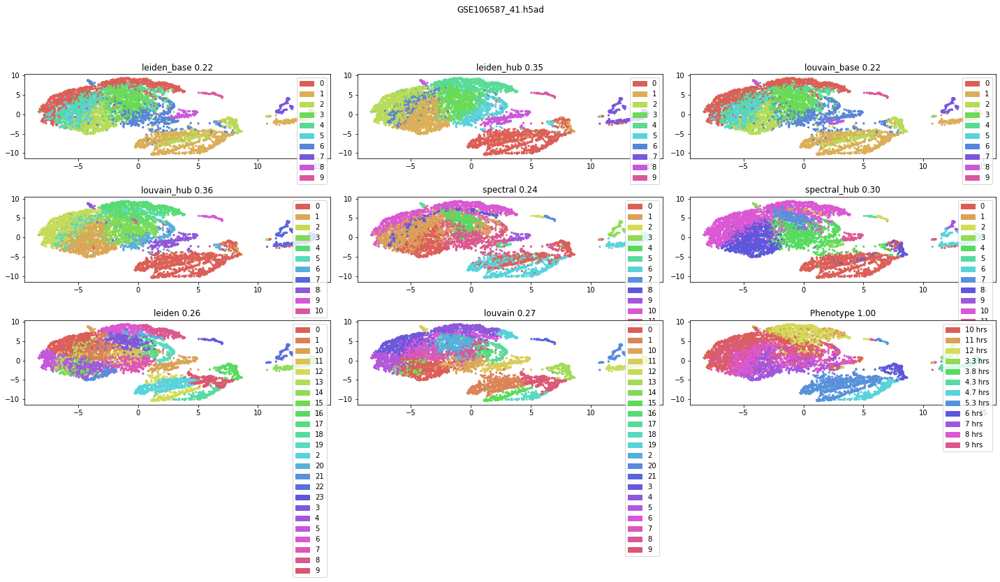

,Base hubness,Reduced hubness
k_skewness,11.571,4.35498
k_skewness_truncnorm,1.40373,1.17736
atkinson,0.898698,0.658654
gini,0.954856,0.806662
robinhood,0.86445,0.660867
antihubs,"[0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 12, 13, 14, 15...","[1, 2, 3, 6, 7, 10, 13, 14, 15, 20, 21, 23, 24..."
antihub_occurrence,0.771333,0.5025
hubs,"[5, 27, 46, 54, 58, 136, 147, 148, 177, 197, 2...","[5, 11, 27, 38, 45, 46, 54, 58, 63, 64, 69, 71..."
hub_occurrence,0.926617,0.7863
groupie_ratio,0.0256,0.00581667




-------------------------------------------------------------------------------------------------------------





In [12]:
rootdir = '../data/Cytotrace_datasets/anndata/'
resdir = '../results/Cytotrace_datasets/'

fnames = np.array(os.listdir(rootdir))
sort_fnames = np.argsort(list(map(lambda fname : int(fname.split('_')[1].split('.')[0]),fnames)))
sorted_fnames = fnames[sort_fnames]

for data_idx in range(len(sorted_fnames))[32:]:
    print(data_idx,end='\r')
    try:
        adata = sc.read(resdir+sorted_fnames[data_idx]) 
    except:
        continue
        
    retainedcells_idx = np.where(np.isin(adata.uns['allcellnames'],adata.uns['cellnames']))[0] if data_idx not in [0,29,32] else range(len(adata.X))

    clustering_analysis(adata,retainedcells_idx,plot_title=sorted_fnames[data_idx])
    
    adata.write(resdir+sorted_fnames[data_idx])
    %xdel adata
    gc.collect()
    
    print("\n\n-------------------------------------------------------------------------------------------------------------\n\n\n")